# Food-11 Image Classification
### Artificial Intelligence and Machine Learning
**Name:** Abhiyan Bhatta | **ID:** 2431322

This notebook implements a complete image classification pipeline on the Food-11 dataset:
- Exploratory Data Analysis
- Baseline CNN (Part A)
- Deeper CNN with Regularisation (Part A)
- Optimiser Comparison & Ablation Study (Part A)
- Transfer Learning with EfficientNetB0 (Part B)


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import zipfile
import os

zip_path = '/content/drive/MyDrive/archive.zip'
extract_path = '/content/food11'

if not os.path.exists(extract_path):
    os.makedirs(extract_path)
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)
    print("Extraction complete!")
else:
    print("Dataset already extracted.")

# Display folder structure
for root, dirs, files in os.walk(extract_path):
    level = root.replace(extract_path, '').count(os.sep)
    if level < 2:
        indent = '  ' * level
        print(f'{indent}{os.path.basename(root)}/ [{len(files)} files]')

Extraction complete!
food11/ [0 files]
  validation/ [0 files]
  training/ [0 files]
  evaluation/ [0 files]


In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from PIL import Image
import random
import time

# Use a different visual style
plt.style.use('seaborn-v0_8-darkgrid')
plt.rcParams['figure.dpi'] = 100
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.right'] = False
np.random.seed(7)
random.seed(7)

## 1. Exploratory Data Analysis

### 1.1 Dataset Description

The Food-11 dataset is a publicly available image classification benchmark containing photographs of food items organised into **11 distinct categories**: Bread, Dairy Product, Dessert, Egg, Fried Food, Meat, Noodles/Pasta, Rice, Seafood, Soup, and Vegetable/Fruit. Each image depicts a single food item photographed under real-world conditions, including variation in lighting, background, plating style, and camera angle.

The dataset is pre-divided into three splits — **training**, **validation**, and **evaluation** — making it suitable for end-to-end deep learning experimentation without requiring manual partitioning. The task is a multi-class single-label classification problem: given an input image, predict which of the 11 food categories it belongs to.

The cells below analyse the dataset structure, class distribution, image dimensions, and pixel statistics before any model is built.

In [5]:
BASE_PATH = '/content/food11'
TRAIN_DIR = os.path.join(BASE_PATH, 'training')
VAL_DIR   = os.path.join(BASE_PATH, 'validation')
EVAL_DIR  = os.path.join(BASE_PATH, 'evaluation')

for directory, label in [(TRAIN_DIR, 'Training'), (VAL_DIR, 'Validation'), (EVAL_DIR, 'Evaluation')]:
    if os.path.exists(directory):
        cls_list = sorted([c for c in os.listdir(directory) if os.path.isdir(os.path.join(directory, c))])
        print(f"{label}: {len(cls_list)} classes  =>  {cls_list}")
    else:
        print(f"{label}: DIRECTORY NOT FOUND")

Training: 11 classes  =>  ['Bread', 'Dairy product', 'Dessert', 'Egg', 'Fried food', 'Meat', 'Noodles-Pasta', 'Rice', 'Seafood', 'Soup', 'Vegetable-Fruit']
Validation: 11 classes  =>  ['Bread', 'Dairy product', 'Dessert', 'Egg', 'Fried food', 'Meat', 'Noodles-Pasta', 'Rice', 'Seafood', 'Soup', 'Vegetable-Fruit']
Evaluation: 11 classes  =>  ['Bread', 'Dairy product', 'Dessert', 'Egg', 'Fried food', 'Meat', 'Noodles-Pasta', 'Rice', 'Seafood', 'Soup', 'Vegetable-Fruit']


In [6]:
def scan_directory(directory, split_label):
    records = []
    if not os.path.exists(directory):
        return pd.DataFrame(records)
    for cls in sorted(os.listdir(directory)):
        cls_path = os.path.join(directory, cls)
        if not os.path.isdir(cls_path):
            continue
        for fname in os.listdir(cls_path):
            if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
                records.append({
                    'filepath': os.path.join(cls_path, fname),
                    'label': cls,
                    'split': split_label,
                    'filename': fname
                })
    return pd.DataFrame(records)

train_df = scan_directory(TRAIN_DIR, 'Training')
val_df   = scan_directory(VAL_DIR,   'Validation')
eval_df  = scan_directory(EVAL_DIR,  'Evaluation')
all_df   = pd.concat([train_df, val_df, eval_df], ignore_index=True)

print(f"Train set   : {len(train_df)} images")
print(f"Val set     : {len(val_df)} images")
print(f"Eval set    : {len(eval_df)} images")
print(f"Grand total : {len(all_df)} images")

Train set   : 9866 images
Val set     : 3430 images
Eval set    : 3347 images
Grand total : 16643 images


In [7]:
# Class distribution table across all splits
dist = all_df.groupby(['label', 'split']).size().unstack(fill_value=0)
for col in ['Training', 'Validation', 'Evaluation']:
    if col not in dist.columns:
        dist[col] = 0
dist['Total'] = dist[['Training', 'Validation', 'Evaluation']].sum(axis=1)
dist = dist[['Training', 'Validation', 'Evaluation', 'Total']].sort_values('Total', ascending=False)
print(dist)
print(f"\nLargest class : {dist.index[0]}  ({dist['Total'].iloc[0]} images)")
print(f"Smallest class: {dist.index[-1]} ({dist['Total'].iloc[-1]} images)")
print(f"Imbalance ratio: {dist['Total'].iloc[0] / dist['Total'].iloc[-1]:.2f}x")

split            Training  Validation  Evaluation  Total
label                                                   
Dessert              1500         500         500   2500
Soup                 1500         500         500   2500
Meat                 1325         449         432   2206
Bread                 994         362         368   1724
Egg                   986         327         335   1648
Seafood               855         347         303   1505
Fried food            848         326         287   1461
Vegetable-Fruit       709         232         231   1172
Noodles-Pasta         440         147         147    734
Dairy product         429         144         148    721
Rice                  280          96          96    472

Largest class : Dessert  (2500 images)
Smallest class: Rice (472 images)
Imbalance ratio: 5.30x


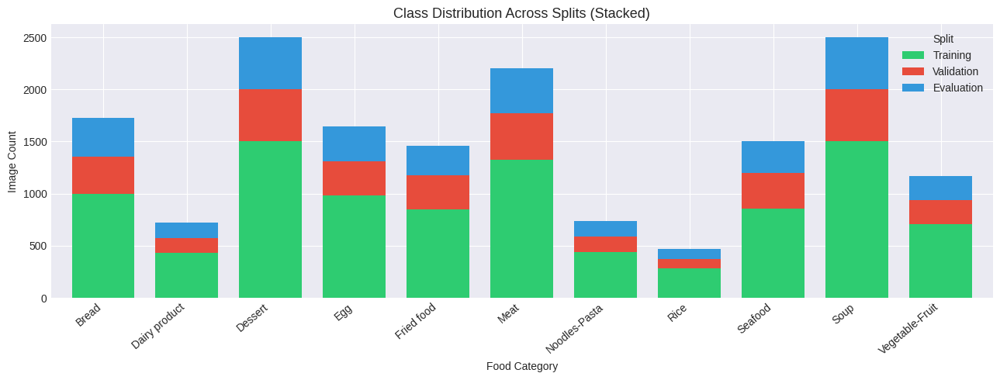

In [8]:
# Stacked bar chart - class distribution per split
fig, ax = plt.subplots(figsize=(13, 5))
plot_data = all_df.groupby(['label', 'split']).size().unstack(fill_value=0)
for col in ['Training', 'Validation', 'Evaluation']:
    if col not in plot_data.columns:
        plot_data[col] = 0
plot_data[['Training', 'Validation', 'Evaluation']].plot(
    kind='bar', stacked=True, ax=ax,
    color=['#2ECC71', '#E74C3C', '#3498DB'], width=0.75
)
ax.set_title('Class Distribution Across Splits (Stacked)', fontsize=13)
ax.set_xlabel('Food Category')
ax.set_ylabel('Image Count')
ax.legend(title='Split', loc='upper right')
plt.xticks(rotation=40, ha='right')
plt.tight_layout()
plt.show()

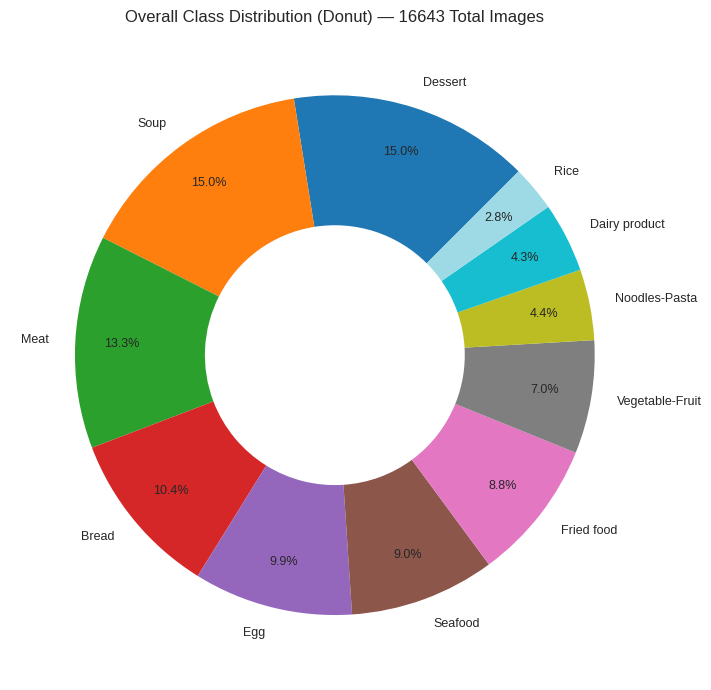

In [9]:
# Donut chart for overall class proportions
class_counts = all_df['label'].value_counts()
fig, ax = plt.subplots(figsize=(9, 7))
palette = plt.cm.tab20(np.linspace(0, 1, len(class_counts)))
wedges, texts, autotexts = ax.pie(
    class_counts.values,
    labels=class_counts.index,
    autopct='%1.1f%%',
    colors=palette,
    startangle=45,
    pctdistance=0.82,
    wedgeprops=dict(width=0.5),  # donut style
    textprops={'fontsize': 9}
)
ax.set_title(f'Overall Class Distribution (Donut) — {len(all_df)} Total Images', fontsize=12)
plt.tight_layout()
plt.show()

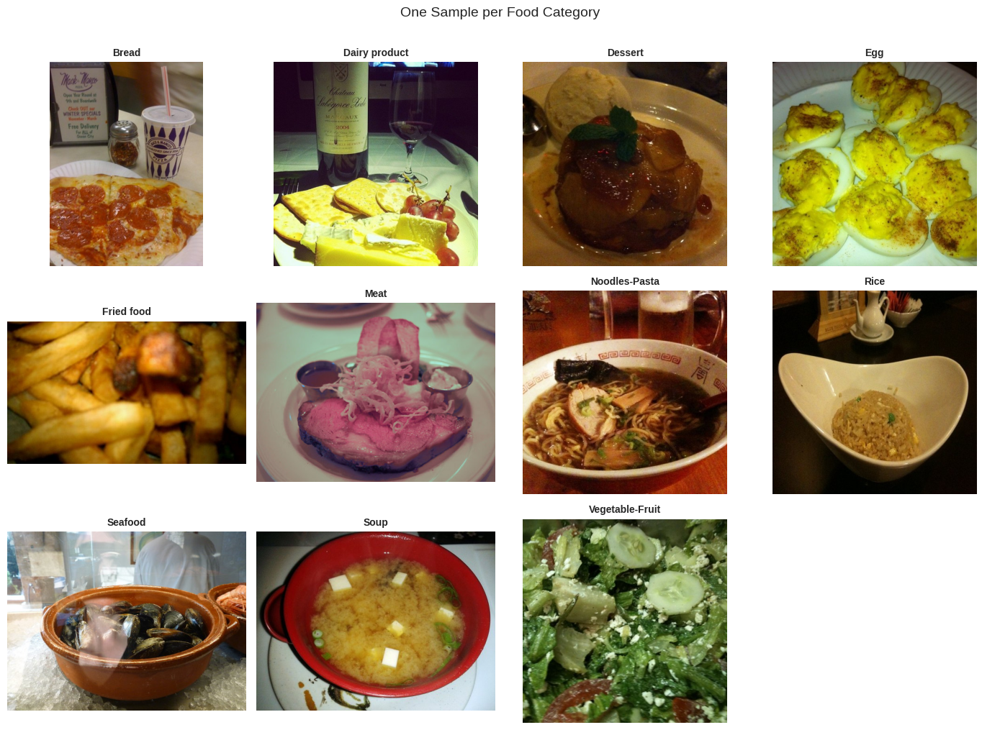

In [10]:
# One representative sample from each class
classes = sorted(all_df['label'].unique())
n_cls = len(classes)

fig, axes = plt.subplots(3, 4, figsize=(14, 10))
axes = axes.flatten()
for idx, cls in enumerate(classes):
    imgs = train_df[train_df['label'] == cls]['filepath'].tolist()
    if imgs:
        img = Image.open(random.choice(imgs))
        axes[idx].imshow(img)
        axes[idx].set_title(cls, fontsize=10, fontweight='bold')
        axes[idx].axis('off')
for idx in range(n_cls, len(axes)):
    axes[idx].axis('off')
plt.suptitle('One Sample per Food Category', fontsize=14, y=1.01)
plt.tight_layout()
plt.show()

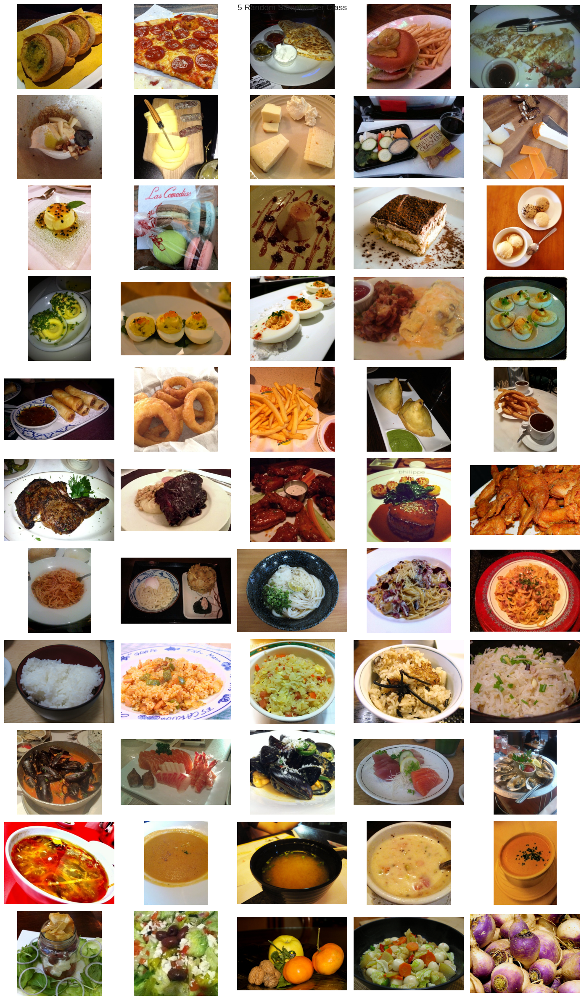

In [11]:
# 5 random samples per class
N_SAMPLES = 5
fig, axes = plt.subplots(n_cls, N_SAMPLES, figsize=(14, 2.2 * n_cls))
for i, cls in enumerate(classes):
    imgs = train_df[train_df['label'] == cls]['filepath'].tolist()
    picks = random.sample(imgs, min(N_SAMPLES, len(imgs)))
    for j in range(N_SAMPLES):
        if j < len(picks):
            axes[i, j].imshow(Image.open(picks[j]))
        axes[i, j].axis('off')
        if j == 0:
            axes[i, j].set_ylabel(cls, fontsize=9, rotation=0, labelpad=55, va='center')
plt.suptitle(f'{N_SAMPLES} Random Samples per Class', fontsize=14)
plt.tight_layout()
plt.show()

In [12]:
# Analyse image dimensions from a sample
sampled = train_df.sample(n=min(600, len(train_df)), random_state=7)
widths, heights, aspects = [], [], []
for fp in sampled['filepath']:
    try:
        w, h = Image.open(fp).size
        widths.append(w)
        heights.append(h)
        aspects.append(w / h)
    except Exception:
        pass

print(f"Width  — min: {min(widths):4d}  max: {max(widths):4d}  mean: {np.mean(widths):.1f}")
print(f"Height — min: {min(heights):4d}  max: {max(heights):4d}  mean: {np.mean(heights):.1f}")
print(f"Aspect ratio — mean: {np.mean(aspects):.3f}  std: {np.std(aspects):.3f}")

Width  — min:  288  max: 2816  mean: 533.1
Height — min:  282  max: 2112  mean: 491.6
Aspect ratio — mean: 1.103  std: 0.237


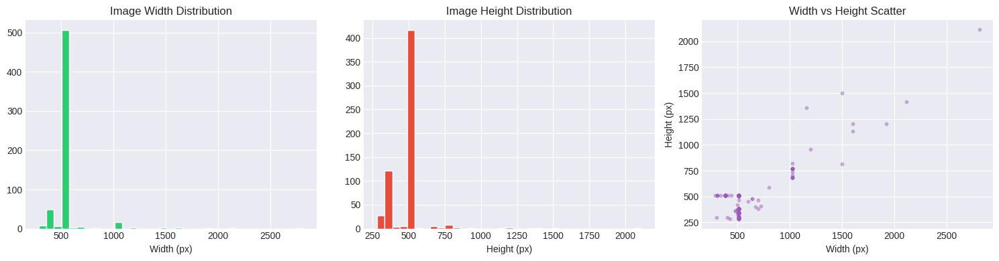

In [13]:
# Dimension distribution plots
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

axes[0].hist(widths,  bins=35, color='#2ECC71', edgecolor='white')
axes[0].set_title('Image Width Distribution')
axes[0].set_xlabel('Width (px)')

axes[1].hist(heights, bins=35, color='#E74C3C', edgecolor='white')
axes[1].set_title('Image Height Distribution')
axes[1].set_xlabel('Height (px)')

axes[2].scatter(widths, heights, alpha=0.4, color='#9B59B6', s=10)
axes[2].set_title('Width vs Height Scatter')
axes[2].set_xlabel('Width (px)')
axes[2].set_ylabel('Height (px)')

plt.tight_layout()
plt.show()

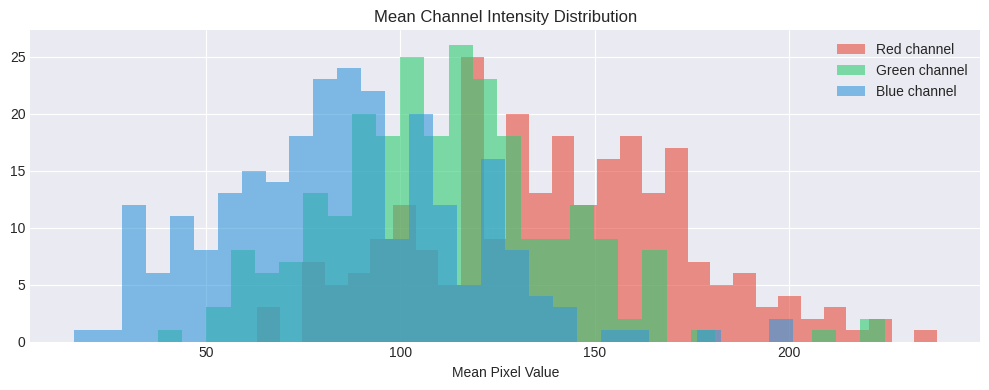

Channel means — R: 139.7  G: 111.2  B: 85.0


In [14]:
# Per-channel pixel intensity analysis
color_sample = train_df.sample(n=min(250, len(train_df)), random_state=7)
r_vals, g_vals, b_vals = [], [], []
for fp in color_sample['filepath']:
    try:
        arr = np.array(Image.open(fp).convert('RGB'))
        r_vals.append(arr[:, :, 0].mean())
        g_vals.append(arr[:, :, 1].mean())
        b_vals.append(arr[:, :, 2].mean())
    except Exception:
        pass

fig, ax = plt.subplots(figsize=(10, 4))
ax.hist(r_vals, bins=30, alpha=0.6, color='#E74C3C', label='Red channel')
ax.hist(g_vals, bins=30, alpha=0.6, color='#2ECC71', label='Green channel')
ax.hist(b_vals, bins=30, alpha=0.6, color='#3498DB', label='Blue channel')
ax.set_title('Mean Channel Intensity Distribution')
ax.set_xlabel('Mean Pixel Value')
ax.legend()
plt.tight_layout()
plt.show()
print(f"Channel means — R: {np.mean(r_vals):.1f}  G: {np.mean(g_vals):.1f}  B: {np.mean(b_vals):.1f}")

In [15]:
# EDA Summary
print("===== EDA Summary =====")
print(f"Total images   : {len(all_df)}")
print(f"Classes        : {all_df['label'].nunique()}")
print(f"Train/Val/Eval : {len(train_df)} / {len(val_df)} / {len(eval_df)}")
print(f"Class imbalance: {class_counts.max()} vs {class_counts.min()} ({class_counts.max()/class_counts.min():.1f}x)")
print("Images vary in size — resizing to a fixed resolution is required.")

===== EDA Summary =====
Total images   : 16643
Classes        : 11
Train/Val/Eval : 9866 / 3430 / 3347
Class imbalance: 2500 vs 472 (5.3x)
Images vary in size — resizing to a fixed resolution is required.


### 1.2 Dataset Split and Preprocessing Rationale

**Train / Validation / Evaluation Split**

The Food-11 dataset ships with a fixed pre-defined split into training, validation, and evaluation sets. This split is retained as-is for two reasons: (1) it ensures that results are directly comparable to published benchmarks on the same dataset, and (2) the evaluation set acts as a completely held-out test set that is never seen during training or hyperparameter tuning, providing an unbiased performance estimate.

**Image Resizing**

All images are resized to **96 × 96 pixels**. The original images vary widely in resolution, so a fixed size is required for batch processing. 96 × 96 was chosen as a balance between computational efficiency (smaller images train faster and consume less GPU memory) and spatial detail retention (large enough for the convolutional filters to capture discriminative food textures and shapes). The same resolution is applied consistently to both scratch-trained models in Part A.

**Pixel Normalisation**

Raw pixel values (0–255) are divided by 255 to map them to the range [0, 1]. Normalising inputs reduces the scale of activations in the early layers, stabilises gradient magnitudes during backpropagation, and allows the network to converge more reliably with standard learning rates.

**Data Augmentation**

Augmentation is applied only to the training generator — not to validation or evaluation — to artificially increase the effective size and diversity of the training set. Techniques used include random rotation, width/height shifts, shear, zoom, horizontal flip, and brightness jitter. This reduces overfitting by ensuring the model cannot memorise exact training images.

## 2. Data Preprocessing and Augmentation
All images are resized to **96 × 96** pixels and pixel values are normalised to [0, 1]. Additional augmentation is applied only to the training set to improve generalisation. A smaller input resolution keeps memory usage manageable and speeds up experimentation.


In [16]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

print("TensorFlow version:", tf.__version__)
print("GPU devices       :", tf.config.list_physical_devices('GPU'))

TensorFlow version: 2.20.0
GPU devices       : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [17]:
IMG_SIZE    = (96, 96)   # Input resolution for all scratch-trained models
BATCH_SIZE  = 32         # Batch size
NUM_CLASSES = 11

# Training augmentation — includes brightness jitter and vertical flip
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    rotation_range=25,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.12,
    zoom_range=0.25,
    horizontal_flip=True,
    vertical_flip=False,          # food images usually have a natural orientation
    brightness_range=[0.8, 1.2],  # slight brightness variation
    fill_mode='reflect'
)

val_datagen  = ImageDataGenerator(rescale=1.0 / 255)
eval_datagen = ImageDataGenerator(rescale=1.0 / 255)

train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', shuffle=True, seed=7
)
val_generator = val_datagen.flow_from_directory(
    VAL_DIR, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', shuffle=False
)
eval_generator = eval_datagen.flow_from_directory(
    EVAL_DIR, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode='categorical', shuffle=False
)

Found 9866 images belonging to 11 classes.
Found 3430 images belonging to 11 classes.
Found 3347 images belonging to 11 classes.


In [18]:
class_indices = train_generator.class_indices
class_names   = list(class_indices.keys())
print("Classes     :", class_names)
print(f"Train/Val/Eval samples: {train_generator.samples} / {val_generator.samples} / {eval_generator.samples}")

Classes     : ['Bread', 'Dairy product', 'Dessert', 'Egg', 'Fried food', 'Meat', 'Noodles-Pasta', 'Rice', 'Seafood', 'Soup', 'Vegetable-Fruit']
Train/Val/Eval samples: 9866 / 3430 / 3347


In [19]:
# Compute class weights to handle imbalance
from sklearn.utils.class_weight import compute_class_weight

unique_classes = np.unique(train_generator.classes)
weights = compute_class_weight(
    class_weight='balanced',
    classes=unique_classes,
    y=train_generator.classes
)
class_weight_dict = dict(zip(unique_classes, weights))
print("Class weights computed:", {class_names[k]: f"{v:.3f}" for k, v in class_weight_dict.items()})

Class weights computed: {'Bread': '0.902', 'Dairy product': '2.091', 'Dessert': '0.598', 'Egg': '0.910', 'Fried food': '1.058', 'Meat': '0.677', 'Noodles-Pasta': '2.038', 'Rice': '3.203', 'Seafood': '1.049', 'Soup': '0.598', 'Vegetable-Fruit': '1.265'}


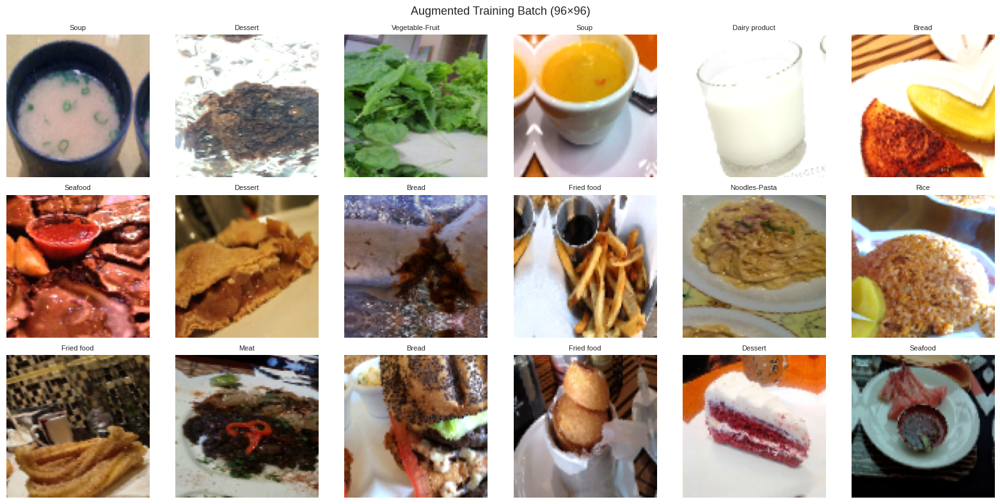

In [20]:
# Visualise a batch of augmented training images
batch_x, batch_y = next(train_generator)
fig, axes = plt.subplots(3, 6, figsize=(16, 8))
for i, ax in enumerate(axes.flatten()):
    ax.imshow(batch_x[i])
    ax.set_title(class_names[np.argmax(batch_y[i])], fontsize=8)
    ax.axis('off')
plt.suptitle('Augmented Training Batch (96×96)', fontsize=13)
plt.tight_layout()
plt.show()

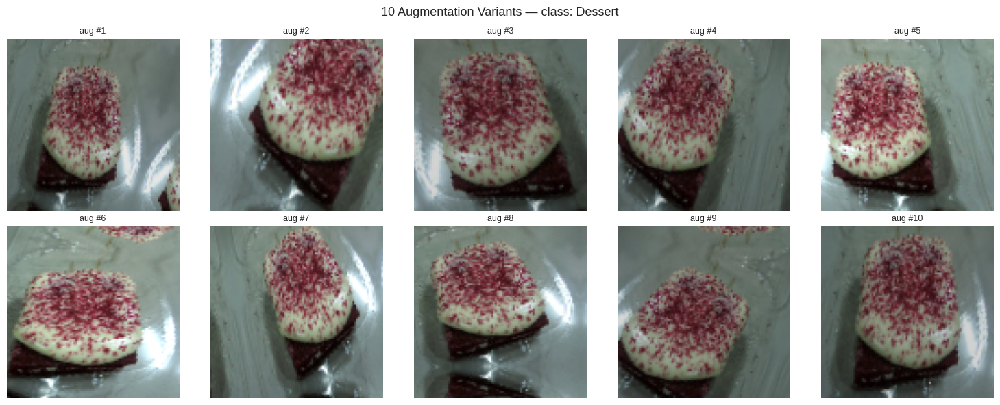

In [21]:
# Show how augmentation transforms a single image
from tensorflow.keras.preprocessing import image as keras_image

sample_cls   = class_names[2]  # pick the 3rd class for variety
sample_dir   = os.path.join(TRAIN_DIR, sample_cls)
sample_file  = os.path.join(sample_dir, os.listdir(sample_dir)[0])

img = keras_image.load_img(sample_file, target_size=IMG_SIZE)
x   = keras_image.img_to_array(img).reshape((1,) + keras_image.img_to_array(img).shape)

fig, axes = plt.subplots(2, 5, figsize=(15, 6))
count = 0
for batch in train_datagen.flow(x, batch_size=1, seed=7):
    axes.flatten()[count].imshow(batch[0])
    axes.flatten()[count].set_title(f'aug #{count+1}', fontsize=9)
    axes.flatten()[count].axis('off')
    count += 1
    if count >= 10:
        break
plt.suptitle(f'10 Augmentation Variants — class: {sample_cls}', fontsize=13)
plt.tight_layout()
plt.show()

## 3. Part A — Baseline CNN Model

A 3-block CNN is built and trained from scratch with no regularisation. Its purpose is to establish a performance baseline against which the deeper regularised architecture and transfer learning model can be compared.

### Architecture Design

| Component | Layer | Filters / Units | Kernel | Activation |
|-----------|-------|-----------------|--------|------------|
| Block 1 | Conv2D | 64 | 5 × 5 | ReLU |
| Block 1 | AveragePooling2D | — | 2 × 2 | — |
| Block 2 | Conv2D | 128 | 3 × 3 | ReLU |
| Block 2 | AveragePooling2D | — | 2 × 2 | — |
| Block 3 | Conv2D | 256 | 3 × 3 | ReLU |
| Block 3 | AveragePooling2D | — | 2 × 2 | — |
| Head | Flatten | — | — | — |
| Head | Dense (FCN-1) | 512 | — | ReLU |
| Head | Dense (FCN-2) | 256 | — | ReLU |
| Head | Dense (FCN-3) | 128 | — | ReLU |
| Output | Dense | 11 | — | Softmax |

**Design choices:**
- The first convolutional layer uses a **5 × 5 kernel** to capture larger spatial patterns at full resolution before the first pooling operation reduces the feature map size.
- Filter counts double across blocks (64 → 128 → 256), following standard practice of increasing representational capacity as spatial dimensions shrink.
- **AveragePooling** is used instead of MaxPooling because it retains more spatial information by averaging over the pooling window rather than discarding all but the maximum activation.
- Three fully connected layers (512 → 256 → 128) before the output progressively reduce the feature dimension and allow the network to learn high-level combinations of the spatial features extracted by the convolutional blocks.

In [22]:
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import (
    Conv2D, AveragePooling2D, MaxPooling2D,
    Flatten, Dense, Input,
    BatchNormalization, Dropout, GlobalAveragePooling2D
)
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import (
    classification_report, confusion_matrix,
    accuracy_score, precision_score, recall_score, f1_score
)

In [23]:
def build_baseline_cnn(input_shape=(96, 96, 3), num_classes=11):
    """
    Baseline CNN architecture:
      Block 1 : Conv2D(64, 5x5, relu) -> AveragePooling2D(2x2)
      Block 2 : Conv2D(128, 3x3, relu) -> AveragePooling2D(2x2)
      Block 3 : Conv2D(256, 3x3, relu) -> AveragePooling2D(2x2)
      Head    : Flatten -> Dense(512) -> Dense(256) -> Dense(128) -> Softmax(11)

    No regularisation is applied so that the baseline reflects raw model
    capacity without any overfitting countermeasures.
    """
    model = Sequential(name='Baseline_CNN')
    model.add(Input(shape=input_shape))

    # Block 1: larger 5x5 kernel captures broader spatial patterns at input resolution
    model.add(Conv2D(64, (5, 5), activation='relu', padding='same'))
    model.add(AveragePooling2D((2, 2)))

    # Block 2: 3x3 kernel; filters doubled to increase representational capacity
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(AveragePooling2D((2, 2)))

    # Block 3: 3x3 kernel; filters doubled again
    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(AveragePooling2D((2, 2)))

    # Classification head: three fully connected layers (FCN-1, FCN-2, FCN-3)
    model.add(Flatten())
    model.add(Dense(512, activation='relu'))   # FCN-1
    model.add(Dense(256, activation='relu'))   # FCN-2
    model.add(Dense(128, activation='relu'))   # FCN-3
    model.add(Dense(num_classes, activation='softmax'))
    return model

baseline_model = build_baseline_cnn()
baseline_model.summary()


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 96, 96, 64)     │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d               │ (None, 48, 48, 64)     │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 48, 48, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_1             │ (None, 24, 24, 128)    │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 24, 24, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_2             │ (None, 12, 12, 256)    │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 36864)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    18,874,880 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 11)             │         1,419 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,414,411 (74.06 MB)

 Trainable params: 19,414,411 (74.06 MB)

 Non-trainable params: 0 (0.00 B)

In [24]:
# Compile the baseline model.
# Adam is used as the optimiser with a learning rate of 0.0008.
# Categorical cross-entropy is the standard loss for multi-class classification
# where labels are one-hot encoded (as produced by flow_from_directory with
# class_mode='categorical').
baseline_model.compile(
    optimizer=Adam(learning_rate=0.0008),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
print(f"Total trainable parameters: {baseline_model.count_params():,}")


Total trainable parameters: 19,414,411


In [25]:
def get_callbacks(patience_es=4, patience_lr=2):
    return [
        EarlyStopping(
            monitor='val_loss', patience=patience_es,
            restore_best_weights=True, verbose=1
        ),
        ReduceLROnPlateau(
            monitor='val_loss', factor=0.3,
            patience=patience_lr, min_lr=1e-7, verbose=1
        )
    ]

t0 = time.time()
baseline_history = baseline_model.fit(
    train_generator,
    epochs=25,
    validation_data=val_generator,
    callbacks=get_callbacks(),
    class_weight=class_weight_dict,
    verbose=1
)
baseline_time = time.time() - t0
print(f"\nBaseline training done in {baseline_time:.1f}s  ({baseline_time/60:.1f} min)")

Epoch 1/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 89s 267ms/step - accuracy: 0.1294 - loss: 2.3385 - val_accuracy: 0.1096 - val_loss: 2.3137 - learning_rate: 8.0000e-04
Epoch 2/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 68s 220ms/step - accuracy: 0.1791 - loss: 2.2632 - val_accuracy: 0.1901 - val_loss: 2.2481 - learning_rate: 8.0000e-04
Epoch 3/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 69s 225ms/step - accuracy: 0.2087 - loss: 2.1754 - val_accuracy: 0.2096 - val_loss: 2.1739 - learning_rate: 8.0000e-04
Epoch 4/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 68s 219ms/step - accuracy: 0.2373 - loss: 2.0758 - val_accuracy: 0.2878 - val_loss: 1.9663 - learning_rate: 8.0000e-04
Epoch 5/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 66s 215ms/step - accuracy: 0.2598 - loss: 2.0117 - val_accuracy: 0.3061 - val_loss: 1.9531 - learning_rate: 8.0000e-04
Epoch 6/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 68s 221ms/step - accuracy: 0.2925 - loss: 1.9231 - val_accuracy: 0.3052 - val_loss: 1.9396 - learning_rate: 8.0000e-04
Epoch 7/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 67s 21

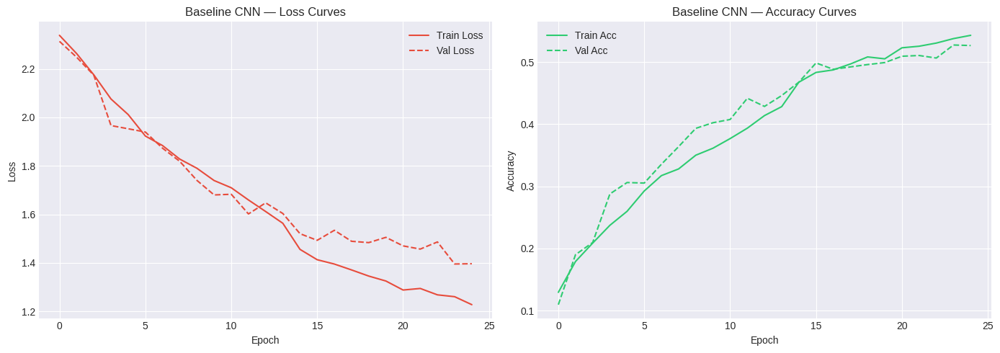

In [26]:
# Training curves
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(baseline_history.history['loss'],     label='Train Loss',  color='#E74C3C')
axes[0].plot(baseline_history.history['val_loss'], label='Val Loss',    color='#E74C3C', linestyle='--')
axes[0].set_title('Baseline CNN — Loss Curves')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].legend()

axes[1].plot(baseline_history.history['accuracy'],     label='Train Acc', color='#2ECC71')
axes[1].plot(baseline_history.history['val_accuracy'], label='Val Acc',   color='#2ECC71', linestyle='--')
axes[1].set_title('Baseline CNN — Accuracy Curves')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy')
axes[1].legend()

plt.tight_layout()
plt.show()

In [27]:
# Evaluate on the held-out evaluation set
baseline_loss, _ = baseline_model.evaluate(eval_generator, verbose=1)

eval_generator.reset()
y_pred_base = np.argmax(baseline_model.predict(eval_generator), axis=1)
y_true      = eval_generator.classes

acc_base  = accuracy_score(y_true, y_pred_base)
prec_base = precision_score(y_true, y_pred_base, average='weighted', zero_division=0)
rec_base  = recall_score(y_true, y_pred_base, average='weighted', zero_division=0)
f1_base   = f1_score(y_true, y_pred_base, average='weighted', zero_division=0)

print(f"\nBaseline CNN Evaluation Results")
print(f"  Accuracy  : {acc_base*100:.2f}%")
print(f"  Precision : {prec_base*100:.2f}%")
print(f"  Recall    : {rec_base*100:.2f}%")
print(f"  F1 Score  : {f1_base*100:.2f}%")
print()
print(classification_report(y_true, y_pred_base, target_names=class_names, zero_division=0))

105/105 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - accuracy: 0.5321 - loss: 1.3475
105/105 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step

Baseline CNN Evaluation Results
  Accuracy  : 53.21%
  Precision : 55.25%
  Recall    : 53.21%
  F1 Score  : 52.28%

                 precision    recall  f1-score   support

          Bread       0.47      0.20      0.28       368
  Dairy product       0.29      0.49      0.36       148
        Dessert       0.63      0.31      0.41       500
            Egg       0.54      0.46      0.49       335
     Fried food       0.37      0.60      0.46       287
           Meat       0.58      0.66      0.62       432
  Noodles-Pasta       0.41      0.59      0.48       147
           Rice       0.34      0.49      0.40        96
        Seafood       0.60      0.60      0.60       303
           Soup       0.66      0.72      0.69       500
Vegetable-Fruit       0.77      0.84      0.80       231

       accuracy                           0.53      3347
      macro avg   

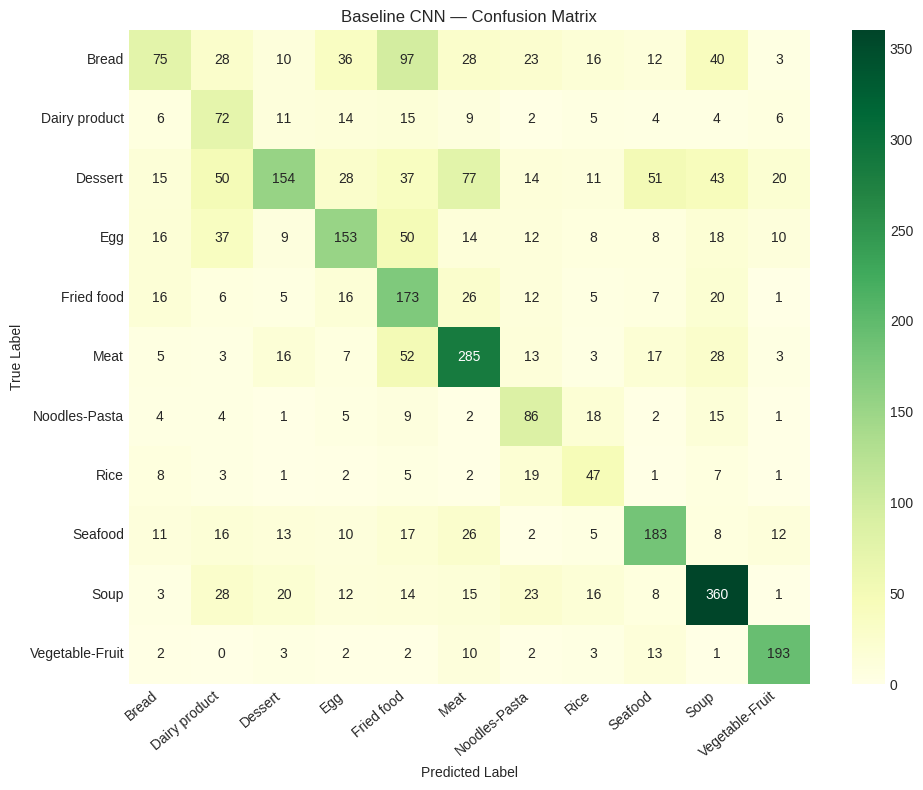

In [28]:
# Confusion matrix
cm_base = confusion_matrix(y_true, y_pred_base)
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(
    cm_base, annot=True, fmt='d', cmap='YlGn',
    xticklabels=class_names, yticklabels=class_names, ax=ax
)
ax.set_title('Baseline CNN — Confusion Matrix')
ax.set_xlabel('Predicted Label')
ax.set_ylabel('True Label')
plt.xticks(rotation=40, ha='right')
plt.tight_layout()
plt.show()

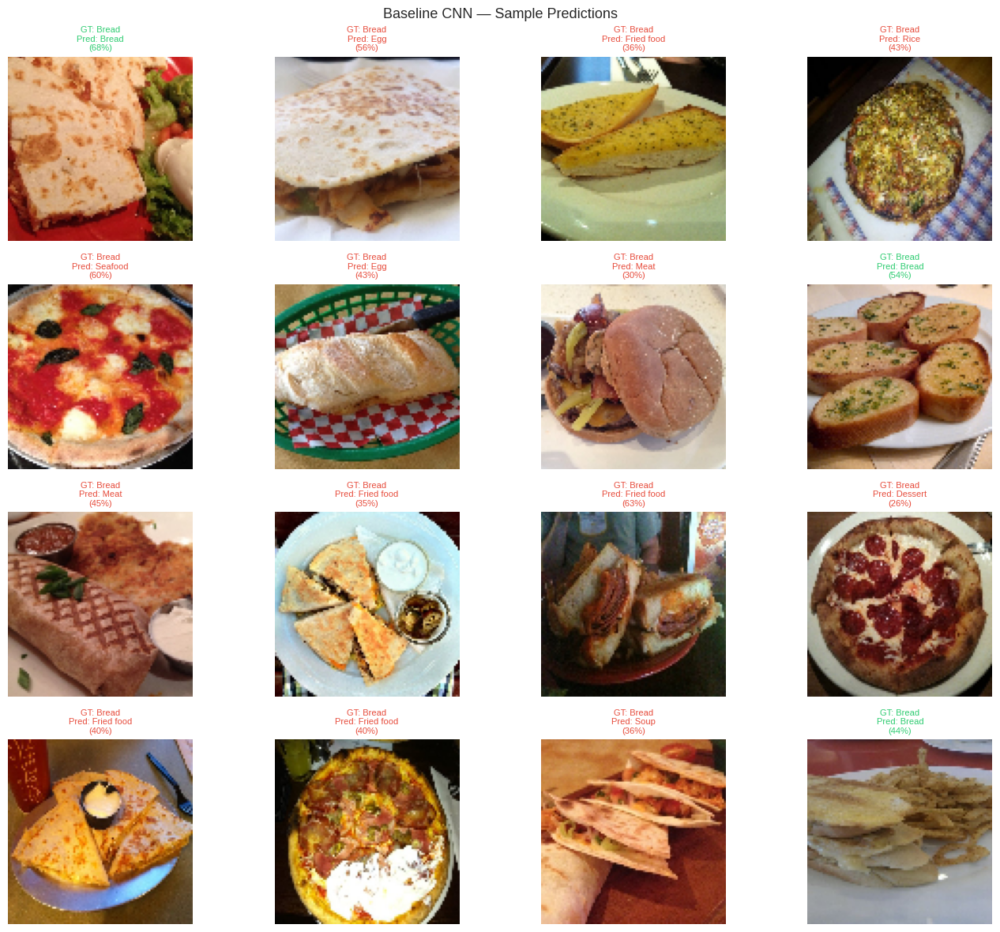

In [29]:
# Inference visualisation — 4 rows × 4 columns
eval_generator.reset()
sx, sy = next(eval_generator)
sp = baseline_model.predict(sx, verbose=0)

fig, axes = plt.subplots(4, 4, figsize=(14, 12))
for i, ax in enumerate(axes.flatten()):
    if i < len(sx):
        ax.imshow(sx[i])
        true_c = class_names[np.argmax(sy[i])]
        pred_c = class_names[np.argmax(sp[i])]
        conf   = np.max(sp[i]) * 100
        clr    = '#2ECC71' if true_c == pred_c else '#E74C3C'
        ax.set_title(f'GT: {true_c}\nPred: {pred_c}\n({conf:.0f}%)', fontsize=8, color=clr)
        ax.axis('off')
plt.suptitle('Baseline CNN — Sample Predictions', fontsize=13)
plt.tight_layout()
plt.show()

In [30]:
# Store baseline results for later comparison
baseline_results = {
    'accuracy': acc_base, 'precision': prec_base,
    'recall': rec_base,   'f1_score': f1_base,
    'eval_loss': baseline_loss,
    'training_time_sec': baseline_time,
    'epochs_trained': len(baseline_history.history['loss']),
    'total_params': baseline_model.count_params(),
    'history': baseline_history.history
}
baseline_model.save('/content/baseline_cnn.keras')
print("Baseline model saved.")

Baseline model saved.


### 3.1 Baseline Model — Observations

The results above reveal the following about the baseline CNN:

- **Accuracy** provides the overall fraction of correctly classified images across all 11 classes. A gap between training accuracy and validation/evaluation accuracy indicates the degree of overfitting.
- **Loss curves** typically show the training loss continuing to decrease after the validation loss plateaus or begins rising — the classic overfitting signature. Because no regularisation (Dropout or BatchNormalisation) is applied, the baseline is expected to overfit to some degree after a sufficient number of epochs. The `EarlyStopping` callback mitigates this by halting training when validation loss stops improving.
- **Confusion matrix** highlights which food categories are most frequently confused. Visually similar classes (e.g. Soup vs Dessert, or Bread vs Rice) tend to produce higher off-diagonal counts.
- **Per-class F1 scores** in the classification report expose class-level imbalances. Classes with fewer training images typically achieve lower recall, even with the class-weight correction applied during training.
- **Inference samples** show individual predictions with confidence scores, giving qualitative insight into model behaviour — including cases where the model is confident but wrong (high-confidence errors are harder to correct).

These baseline metrics serve as the reference point for all subsequent experiments. Any improvement in the deeper model or transfer learning model is measured relative to these figures.

## 4. Deeper CNN with Regularisation

The deeper model extends the baseline by roughly doubling the number of convolutional layers (7 total vs 3 in the baseline) and introducing regularisation at every block.

### Architecture Design

| Component | Layer | Filters / Units | Kernel | Regularisation |
|-----------|-------|-----------------|--------|----------------|
| Block 1 | Conv2D × 2 | 64 | 3 × 3 | BatchNorm + Dropout(0.20) |
| Block 1 | AveragePooling2D | — | 2 × 2 | — |
| Block 2 | Conv2D × 2 | 128 | 3 × 3 | BatchNorm + Dropout(0.25) |
| Block 2 | AveragePooling2D | — | 2 × 2 | — |
| Block 3 | SeparableConv2D × 2 | 256 | 3 × 3 | BatchNorm + Dropout(0.30) |
| Block 3 | AveragePooling2D | — | 2 × 2 | — |
| Block 4 | Conv2D (1×1 bottleneck) | 512 | 1 × 1 | BatchNorm + Dropout(0.30) |
| Head | GlobalAveragePooling2D | — | — | — |
| Head | Dense | 256 | — | BatchNorm + Dropout(0.50) |
| Output | Dense | 11 | — | Softmax |

**Design choices and rationale:**
- **BatchNormalization** after every convolutional layer normalises activations across the mini-batch, which stabilises training dynamics, allows higher learning rates, and acts as a mild regulariser by adding noise to the forward pass.
- **Dropout** at increasing rates (0.20 → 0.50) randomly zeros activations during training, forcing the network to learn redundant representations and reducing co-adaptation of neurons — the primary mechanism for reducing overfitting.
- **SeparableConv2D** in Block 3 factorises a standard convolution into a depthwise spatial convolution followed by a pointwise 1×1 convolution. This achieves comparable representational capacity to a standard Conv2D layer with significantly fewer parameters, reducing training time and the risk of overfitting.
- **1 × 1 bottleneck convolution** in Block 4 mixes information across channels without any spatial aggregation, acting as a learned feature recombination step before the global pooling.
- **GlobalAveragePooling2D** replaces Flatten. Rather than unrolling all spatial positions into a vector (which can be very large), GAP takes the mean of each feature map, producing a compact 512-dimensional vector and reducing the parameter count of the Dense head substantially.

In [31]:
from tensorflow.keras.layers import SeparableConv2D

In [32]:
def build_deeper_cnn(input_shape=(96, 96, 3), num_classes=11):
    """
    Deeper CNN (7 conv layers total):
      Block 1: 2x Conv(64, 3x3) + BN + AvgPool + Dropout(0.2)
      Block 2: 2x Conv(128, 3x3) + BN + AvgPool + Dropout(0.25)
      Block 3: 2x SeparableConv(256) + BN + AvgPool + Dropout(0.3)
      Block 4: 1x Conv(512, 1x1) + BN + Dropout(0.3)    [bottleneck]
      Head   : GAP -> Dense(256) -> BN -> Dropout(0.5) -> Softmax(11)
    """
    model = Sequential(name='Deeper_CNN')
    model.add(Input(shape=input_shape))

    # Block 1
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(AveragePooling2D((2, 2)))
    model.add(Dropout(0.20))

    # Block 2
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(AveragePooling2D((2, 2)))
    model.add(Dropout(0.25))

    # Block 3 — depthwise-separable convolutions (fewer params, same depth)
    model.add(SeparableConv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(SeparableConv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(AveragePooling2D((2, 2)))
    model.add(Dropout(0.30))

    # Block 4 — 1×1 bottleneck conv to mix channels
    model.add(Conv2D(512, (1, 1), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(Dropout(0.30))

    # Classification head
    model.add(GlobalAveragePooling2D())
    model.add(Dense(256, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.50))
    model.add(Dense(num_classes, activation='softmax'))
    return model

deeper_model = build_deeper_cnn()
deeper_model.summary()

Model: "Deeper_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 96, 96, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 96, 96, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 96, 96, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 96, 96, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_3             │ (None, 48, 48, 64)     │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 48, 48, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 48, 48, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 48, 48, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 48, 48, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 48, 48, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_4             │ (None, 24, 24, 128)    │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 24, 24, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d                │ (None, 24, 24, 256)    │        34,176 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 24, 24, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_1              │ (None, 24, 24, 256)    │        68,096 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 24, 24, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_5             │ (None, 12, 12, 256)    │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 12, 12, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 12, 12, 512)    │       131,584 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 634,827 (2.42 MB)

 Trainable params: 631,499 (2.41 MB)

 Non-trainable params: 3,328 (13.00 KB)

In [33]:
print(f"Baseline parameters : {baseline_model.count_params():,}")
print(f"Deeper parameters   : {deeper_model.count_params():,}")

Baseline parameters : 19,414,411
Deeper parameters   : 634,827


In [34]:
deeper_model.compile(
    optimizer=Adam(learning_rate=0.0003),   # lower LR for the larger model
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

t0 = time.time()
deeper_history = deeper_model.fit(
    train_generator,
    epochs=25,
    validation_data=val_generator,
    callbacks=get_callbacks(),
    class_weight=class_weight_dict,
    verbose=1
)
deeper_time = time.time() - t0
print(f"\nDeeper model training done in {deeper_time:.1f}s  ({deeper_time/60:.1f} min)")

Epoch 1/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 111s 292ms/step - accuracy: 0.1781 - loss: 2.8537 - val_accuracy: 0.0280 - val_loss: 3.2250 - learning_rate: 3.0000e-04
Epoch 2/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 69s 223ms/step - accuracy: 0.2208 - loss: 2.4670 - val_accuracy: 0.1714 - val_loss: 2.4901 - learning_rate: 3.0000e-04
Epoch 3/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 81s 261ms/step - accuracy: 0.2667 - loss: 2.2706 - val_accuracy: 0.2452 - val_loss: 2.7905 - learning_rate: 3.0000e-04
Epoch 4/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step - accuracy: 0.2809 - loss: 2.1693
Epoch 4: ReduceLROnPlateau reducing learning rate to 9.000000427477062e-05.
309/309 ━━━━━━━━━━━━━━━━━━━━ 70s 227ms/step - accuracy: 0.2924 - loss: 2.1301 - val_accuracy: 0.2603 - val_loss: 2.5742 - learning_rate: 3.0000e-04
Epoch 5/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 69s 225ms/step - accuracy: 0.3406 - loss: 1.9255 - val_accuracy: 0.3052 - val_loss: 2.3305 - learning_rate: 9.0000e-05
Epoch 6/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 69s 224ms/s

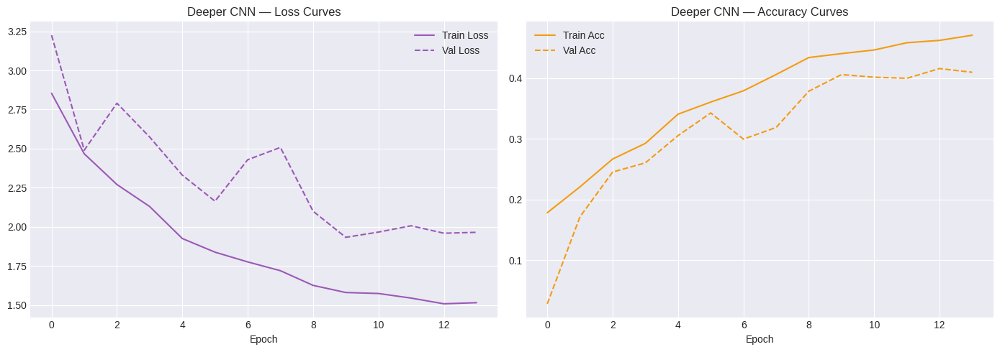

In [35]:
# Training curves for deeper model
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(deeper_history.history['loss'],     label='Train Loss',  color='#9B59B6')
axes[0].plot(deeper_history.history['val_loss'], label='Val Loss',    color='#9B59B6', linestyle='--')
axes[0].set_title('Deeper CNN — Loss Curves')
axes[0].set_xlabel('Epoch')
axes[0].legend()

axes[1].plot(deeper_history.history['accuracy'],     label='Train Acc', color='#F39C12')
axes[1].plot(deeper_history.history['val_accuracy'], label='Val Acc',   color='#F39C12', linestyle='--')
axes[1].set_title('Deeper CNN — Accuracy Curves')
axes[1].set_xlabel('Epoch')
axes[1].legend()

plt.tight_layout()
plt.show()

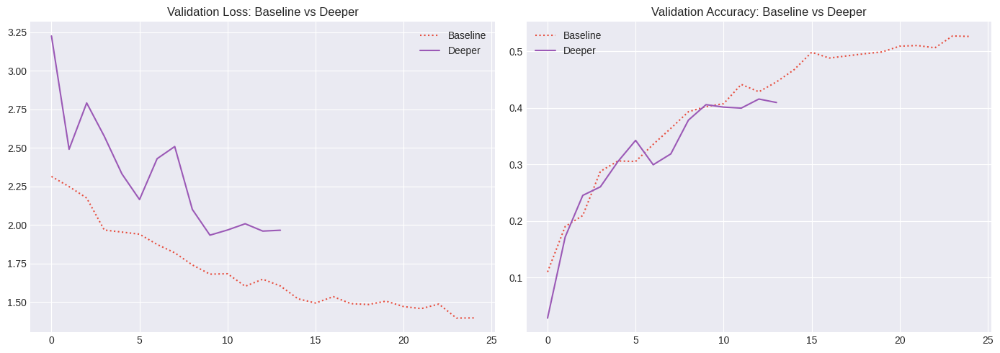

In [36]:
# Side-by-side validation comparison: Baseline vs Deeper
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(baseline_results['history']['val_loss'], label='Baseline', color='#E74C3C', linestyle=':')
axes[0].plot(deeper_history.history['val_loss'],      label='Deeper',   color='#9B59B6')
axes[0].set_title('Validation Loss: Baseline vs Deeper')
axes[0].legend()

axes[1].plot(baseline_results['history']['val_accuracy'], label='Baseline', color='#E74C3C', linestyle=':')
axes[1].plot(deeper_history.history['val_accuracy'],      label='Deeper',   color='#9B59B6')
axes[1].set_title('Validation Accuracy: Baseline vs Deeper')
axes[1].legend()

plt.tight_layout()
plt.show()

In [37]:
# Evaluate deeper model
deeper_loss, _ = deeper_model.evaluate(eval_generator, verbose=1)

eval_generator.reset()
y_pred_deep = np.argmax(deeper_model.predict(eval_generator), axis=1)
y_true = eval_generator.classes

acc_deep  = accuracy_score(y_true, y_pred_deep)
prec_deep = precision_score(y_true, y_pred_deep, average='weighted', zero_division=0)
rec_deep  = recall_score(y_true, y_pred_deep, average='weighted', zero_division=0)
f1_deep   = f1_score(y_true, y_pred_deep, average='weighted', zero_division=0)

print(f"\nDeeper CNN Evaluation Results")
print(f"  Accuracy  : {acc_deep*100:.2f}%")
print(f"  Precision : {prec_deep*100:.2f}%")
print(f"  Recall    : {rec_deep*100:.2f}%")
print(f"  F1 Score  : {f1_deep*100:.2f}%")
print()
print(classification_report(y_true, y_pred_deep, target_names=class_names, zero_division=0))

105/105 ━━━━━━━━━━━━━━━━━━━━ 14s 131ms/step - accuracy: 0.4293 - loss: 1.8316
105/105 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step

Deeper CNN Evaluation Results
  Accuracy  : 42.93%
  Precision : 53.33%
  Recall    : 42.93%
  F1 Score  : 41.95%

                 precision    recall  f1-score   support

          Bread       0.34      0.30      0.32       368
  Dairy product       0.21      0.39      0.27       148
        Dessert       0.48      0.34      0.40       500
            Egg       0.50      0.26      0.34       335
     Fried food       0.73      0.20      0.31       287
           Meat       0.48      0.70      0.57       432
  Noodles-Pasta       0.22      0.65      0.32       147
           Rice       0.25      0.67      0.36        96
        Seafood       0.55      0.50      0.52       303
           Soup       0.92      0.26      0.40       500
Vegetable-Fruit       0.54      0.94      0.69       231

       accuracy                           0.43      3347
      macro avg    

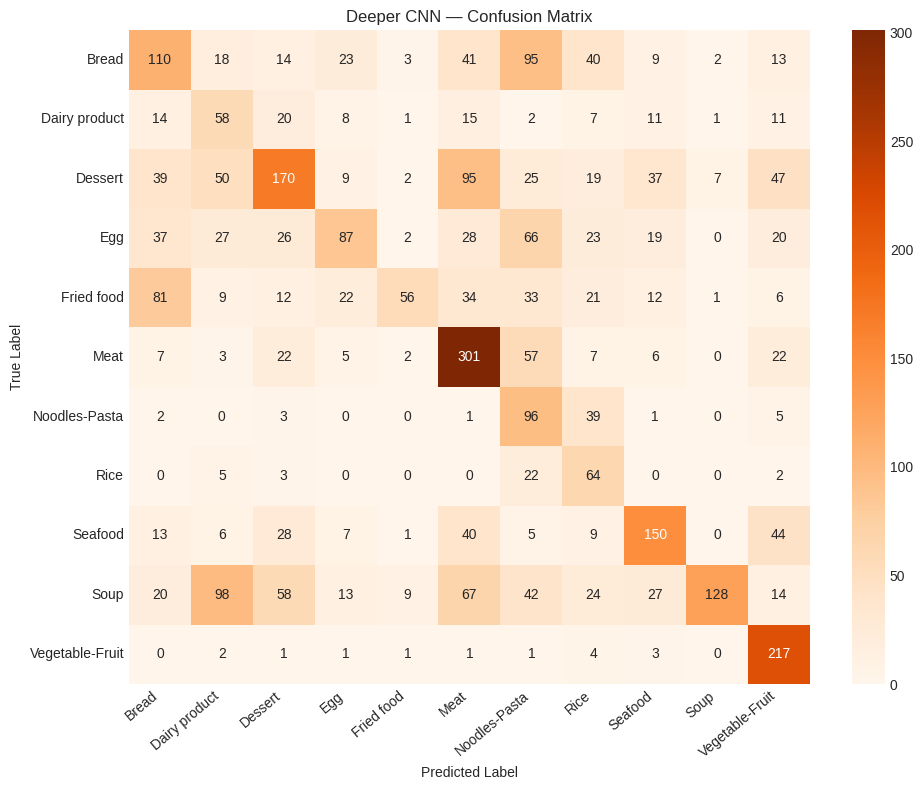

In [38]:
# Confusion matrix — orange palette
cm_deep = confusion_matrix(y_true, y_pred_deep)
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(
    cm_deep, annot=True, fmt='d', cmap='Oranges',
    xticklabels=class_names, yticklabels=class_names, ax=ax
)
ax.set_title('Deeper CNN — Confusion Matrix')
ax.set_xlabel('Predicted Label')
ax.set_ylabel('True Label')
plt.xticks(rotation=40, ha='right')
plt.tight_layout()
plt.show()

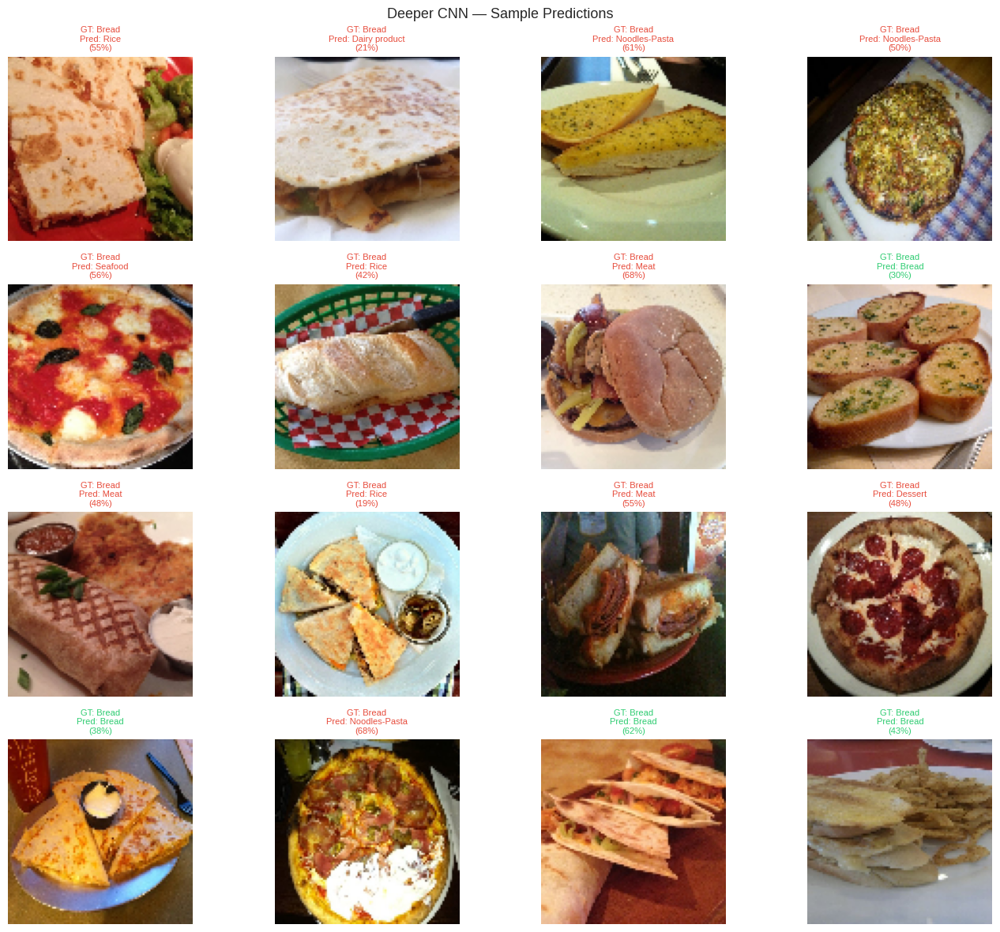

In [39]:
# Sample predictions — deeper model
eval_generator.reset()
sx, sy = next(eval_generator)
sp = deeper_model.predict(sx, verbose=0)

fig, axes = plt.subplots(4, 4, figsize=(14, 12))
for i, ax in enumerate(axes.flatten()):
    if i < len(sx):
        ax.imshow(sx[i])
        true_c = class_names[np.argmax(sy[i])]
        pred_c = class_names[np.argmax(sp[i])]
        conf   = np.max(sp[i]) * 100
        clr    = '#2ECC71' if true_c == pred_c else '#E74C3C'
        ax.set_title(f'GT: {true_c}\nPred: {pred_c}\n({conf:.0f}%)', fontsize=8, color=clr)
        ax.axis('off')
plt.suptitle('Deeper CNN — Sample Predictions', fontsize=13)
plt.tight_layout()
plt.show()

In [40]:
deeper_results = {
    'accuracy': acc_deep, 'precision': prec_deep,
    'recall': rec_deep,   'f1_score': f1_deep,
    'eval_loss': deeper_loss,
    'training_time_sec': deeper_time,
    'epochs_trained': len(deeper_history.history['loss']),
    'total_params': deeper_model.count_params(),
    'history': deeper_history.history
}

print(f"{'':22s} {'Baseline':>10s} {'Deeper':>10s}")
print(f"{'Accuracy':22s} {baseline_results['accuracy']*100:>9.2f}% {acc_deep*100:>9.2f}%")
print(f"{'F1 Score':22s} {baseline_results['f1_score']*100:>9.2f}% {f1_deep*100:>9.2f}%")
print(f"{'Training Time (s)':22s} {baseline_results['training_time_sec']:>9.1f}  {deeper_time:>9.1f}")

deeper_model.save('/content/deeper_cnn.keras')

                         Baseline     Deeper
Accuracy                   53.21%     42.93%
F1 Score                   52.28%     41.95%
Training Time (s)         1750.7     1048.4


### 4.1 Deeper Model — Observations and Comparison with Baseline

The comparison table and validation curves above reveal how adding depth and regularisation affects model behaviour:

- **Overfitting reduction:** The gap between training and validation accuracy typically narrows in the deeper model compared to the baseline, because BatchNormalization and Dropout act as regularisers during training.
- **Accuracy and F1:** If the deeper model achieves higher evaluation accuracy and F1 score than the baseline, it indicates that the additional representational capacity (more layers and filters) captures more discriminative features, and that the regularisation successfully prevents this extra capacity from simply memorising training data.
- **Training time trade-off:** The deeper model has more parameters and more forward/backward passes per batch, so it takes longer to train. The parameter comparison printed above quantifies this cost. Whether the accuracy gain justifies the computational overhead depends on the specific use case.
- **Loss curve shape:** Well-regularised models tend to show training and validation loss curves that track each other more closely and diverge later. A large and early divergence suggests the regularisation strength may need tuning.
- **Per-class performance:** Inspecting per-class F1 scores in the classification report can reveal whether improvements are broadly distributed across all 11 classes or concentrated in a few high-frequency classes.

## 5. Experimentation and Comparative Analysis

This section systematically compares model variants to understand the effect of optimiser choice and individual architecture components on classification performance.

### 5.1 Optimiser Comparison: SGD vs Adam

The deeper CNN architecture is trained twice — once with **Adam** (already done in Section 4) and once with **SGD with Nesterov momentum** — to compare convergence behaviour and final performance.

**Adam** maintains per-parameter adaptive learning rates using estimates of first and second moments of the gradients. This generally leads to fast initial convergence and stable training, particularly for deep networks.

**SGD with momentum** applies a uniform learning rate to all parameters but uses a velocity term (momentum = 0.9) to smooth gradient updates and avoid oscillation. Nesterov momentum computes the gradient at the look-ahead position, which can improve convergence speed over standard momentum. SGD often converges to flatter minima that generalise better than Adam, but typically requires more careful learning rate tuning and more epochs to converge.

In [41]:
from tensorflow.keras.optimizers import SGD

deeper_sgd = build_deeper_cnn()
deeper_sgd.compile(
    optimizer=SGD(learning_rate=0.01, momentum=0.9, nesterov=True),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

t0 = time.time()
sgd_history = deeper_sgd.fit(
    train_generator,
    epochs=25,
    validation_data=val_generator,
    callbacks=get_callbacks(),
    class_weight=class_weight_dict,
    verbose=1
)
sgd_time = time.time() - t0
print(f"SGD training done in {sgd_time:.1f}s")

Epoch 1/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 96s 274ms/step - accuracy: 0.1545 - loss: 2.8019 - val_accuracy: 0.1222 - val_loss: 2.6142 - learning_rate: 0.0100
Epoch 2/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 118s 220ms/step - accuracy: 0.1805 - loss: 2.4676 - val_accuracy: 0.2356 - val_loss: 2.2107 - learning_rate: 0.0100
Epoch 3/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 70s 225ms/step - accuracy: 0.2074 - loss: 2.3070 - val_accuracy: 0.1831 - val_loss: 2.3592 - learning_rate: 0.0100
Epoch 4/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 71s 229ms/step - accuracy: 0.2185 - loss: 2.2340 - val_accuracy: 0.2475 - val_loss: 2.1115 - learning_rate: 0.0100
Epoch 5/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 69s 224ms/step - accuracy: 0.2247 - loss: 2.1693 - val_accuracy: 0.2312 - val_loss: 2.1958 - learning_rate: 0.0100
Epoch 6/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - accuracy: 0.2415 - loss: 2.1357
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0029999999329447745.
309/309 ━━━━━━━━━━━━━━━━━━━━ 71s 229ms/step - accuracy: 0.24

In [42]:
# Evaluate SGD model
eval_generator.reset()
sgd_loss, _ = deeper_sgd.evaluate(eval_generator, verbose=1)
eval_generator.reset()
y_pred_sgd = np.argmax(deeper_sgd.predict(eval_generator), axis=1)
y_true = eval_generator.classes

acc_sgd  = accuracy_score(y_true, y_pred_sgd)
prec_sgd = precision_score(y_true, y_pred_sgd, average='weighted', zero_division=0)
rec_sgd  = recall_score(y_true, y_pred_sgd,  average='weighted', zero_division=0)
f1_sgd   = f1_score(y_true, y_pred_sgd,      average='weighted', zero_division=0)

print(f"SGD — Accuracy: {acc_sgd*100:.2f}%   F1: {f1_sgd*100:.2f}%")

105/105 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - accuracy: 0.4114 - loss: 1.6906
105/105 ━━━━━━━━━━━━━━━━━━━━ 14s 114ms/step
SGD — Accuracy: 41.14%   F1: 40.35%


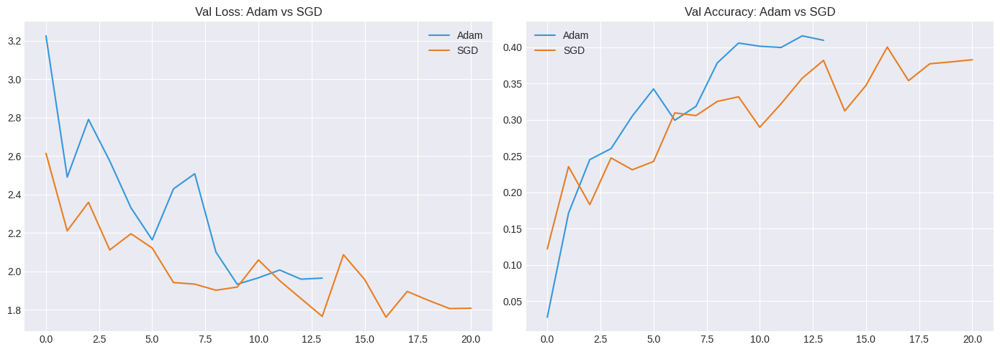


                         Adam        SGD
Accuracy               42.93%     41.14%
F1 Score               41.95%     40.35%
Time (s)              1048.4     1577.5


In [43]:
# Adam vs SGD learning curves
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(deeper_results['history']['val_loss'], label='Adam',     color='#3498DB')
axes[0].plot(sgd_history.history['val_loss'],       label='SGD',      color='#E67E22')
axes[0].set_title('Val Loss: Adam vs SGD')
axes[0].legend()

axes[1].plot(deeper_results['history']['val_accuracy'], label='Adam',    color='#3498DB')
axes[1].plot(sgd_history.history['val_accuracy'],       label='SGD',     color='#E67E22')
axes[1].set_title('Val Accuracy: Adam vs SGD')
axes[1].legend()

plt.tight_layout()
plt.show()

sgd_results = {
    'accuracy': acc_sgd, 'precision': prec_sgd,
    'recall': rec_sgd,   'f1_score': f1_sgd,
    'eval_loss': sgd_loss, 'training_time_sec': sgd_time,
    'epochs_trained': len(sgd_history.history['loss']),
    'history': sgd_history.history
}

print(f"\n{'':18s} {'Adam':>10s} {'SGD':>10s}")
print(f"{'Accuracy':18s} {deeper_results['accuracy']*100:>9.2f}% {acc_sgd*100:>9.2f}%")
print(f"{'F1 Score':18s} {deeper_results['f1_score']*100:>9.2f}% {f1_sgd*100:>9.2f}%")
print(f"{'Time (s)':18s} {deeper_results['training_time_sec']:>9.1f}  {sgd_time:>9.1f}")

### 5.1.1 Optimiser Comparison — Observations

The learning curves and summary table above show the following:

- **Convergence speed:** Adam typically reaches a lower validation loss faster in the early epochs due to its adaptive per-parameter learning rates. SGD with Nesterov momentum may start slower but can catch up given enough epochs.
- **Final performance:** The final accuracy and F1 score of the two optimisers can be similar, especially with early stopping, because both are given the same maximum number of epochs and the same learning rate reduction callback. If Adam achieves notably higher accuracy, it suggests the landscape of this problem responds well to adaptive learning rates. If SGD is competitive, it confirms that a well-tuned fixed learning rate with momentum is sufficient.
- **Training stability:** SGD curves may show more oscillation early on before the learning rate decays, whereas Adam tends to be smoother throughout.
- **Practical recommendation:** For fine-tuning and complex architectures, Adam is generally preferred for its ease of use. SGD is often preferred when training from scratch for extended runs where careful scheduling is feasible.

### 5.2 Ablation Study — Removing Batch Normalisation
To measure the contribution of BatchNormalization, we train a version of the deeper model with all BN layers removed while keeping Dropout unchanged. This isolates the effect of batch normalisation on training stability and generalisation.


In [44]:
def build_no_batchnorm(input_shape=(96, 96, 3), num_classes=11):
    """
    Same deeper architecture but with ALL BatchNormalization layers removed.
    Dropout is kept to isolate the effect of BN.
    """
    model = Sequential(name='No_BatchNorm')
    model.add(Input(shape=input_shape))

    # Block 1 — no BN
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(AveragePooling2D((2, 2)))
    model.add(Dropout(0.20))

    # Block 2 — no BN
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(AveragePooling2D((2, 2)))
    model.add(Dropout(0.25))

    # Block 3 — no BN
    model.add(SeparableConv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(SeparableConv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(AveragePooling2D((2, 2)))
    model.add(Dropout(0.30))

    # Block 4 — no BN
    model.add(Conv2D(512, (1, 1), activation='relu', padding='same'))
    model.add(Dropout(0.30))

    model.add(GlobalAveragePooling2D())
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.50))
    model.add(Dense(num_classes, activation='softmax'))
    return model

ablation_model = build_no_batchnorm()
ablation_model.compile(
    optimizer=Adam(learning_rate=0.0003),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

t0 = time.time()
ablation_history = ablation_model.fit(
    train_generator,
    epochs=25,
    validation_data=val_generator,
    callbacks=get_callbacks(),
    class_weight=class_weight_dict,
    verbose=1
)
abl_time = time.time() - t0
print(f"Ablation (no BN) done in {abl_time:.1f}s")

Epoch 1/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 91s 264ms/step - accuracy: 0.1138 - loss: 2.3982 - val_accuracy: 0.1309 - val_loss: 2.3982 - learning_rate: 3.0000e-04
Epoch 2/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 80s 259ms/step - accuracy: 0.1141 - loss: 2.3763 - val_accuracy: 0.1035 - val_loss: 2.3767 - learning_rate: 3.0000e-04
Epoch 3/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 71s 230ms/step - accuracy: 0.1064 - loss: 2.3493 - val_accuracy: 0.1143 - val_loss: 2.3578 - learning_rate: 3.0000e-04
Epoch 4/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 71s 230ms/step - accuracy: 0.1257 - loss: 2.3348 - val_accuracy: 0.1388 - val_loss: 2.3331 - learning_rate: 3.0000e-04
Epoch 5/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 72s 232ms/step - accuracy: 0.1257 - loss: 2.3233 - val_accuracy: 0.1598 - val_loss: 2.3145 - learning_rate: 3.0000e-04
Epoch 6/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 70s 226ms/step - accuracy: 0.1589 - loss: 2.2642 - val_accuracy: 0.1816 - val_loss: 2.2243 - learning_rate: 3.0000e-04
Epoch 7/25
309/309 ━━━━━━━━━━━━━━━━━━━━ 71s 22

In [45]:
# Evaluate ablation model
eval_generator.reset()
abl_loss, _ = ablation_model.evaluate(eval_generator, verbose=1)
eval_generator.reset()
y_pred_abl = np.argmax(ablation_model.predict(eval_generator), axis=1)
y_true = eval_generator.classes

acc_abl  = accuracy_score(y_true, y_pred_abl)
prec_abl = precision_score(y_true, y_pred_abl, average='weighted', zero_division=0)
rec_abl  = recall_score(y_true, y_pred_abl,  average='weighted', zero_division=0)
f1_abl   = f1_score(y_true, y_pred_abl,      average='weighted', zero_division=0)

print(f"No-BN ablation — Accuracy: {acc_abl*100:.2f}%   F1: {f1_abl*100:.2f}%")

105/105 ━━━━━━━━━━━━━━━━━━━━ 12s 111ms/step - accuracy: 0.3272 - loss: 1.8485
105/105 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step
No-BN ablation — Accuracy: 32.72%   F1: 27.89%


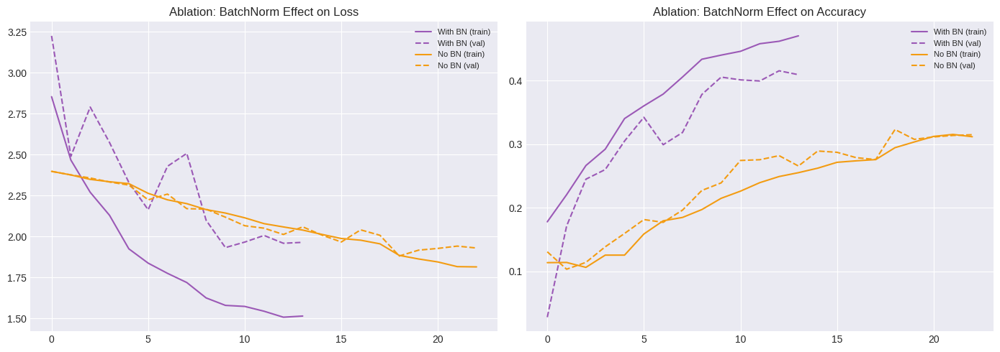

With BatchNorm : acc=42.93%  f1=41.95%
No  BatchNorm  : acc=32.72%  f1=27.89%


In [46]:
# Ablation curves — with BN vs without BN
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(deeper_results['history']['loss'],         label='With BN (train)', color='#9B59B6')
axes[0].plot(deeper_results['history']['val_loss'],     label='With BN (val)',   color='#9B59B6', linestyle='--')
axes[0].plot(ablation_history.history['loss'],          label='No BN (train)',   color='#F39C12')
axes[0].plot(ablation_history.history['val_loss'],      label='No BN (val)',     color='#F39C12', linestyle='--')
axes[0].set_title('Ablation: BatchNorm Effect on Loss')
axes[0].legend(fontsize=8)

axes[1].plot(deeper_results['history']['accuracy'],     label='With BN (train)', color='#9B59B6')
axes[1].plot(deeper_results['history']['val_accuracy'], label='With BN (val)',   color='#9B59B6', linestyle='--')
axes[1].plot(ablation_history.history['accuracy'],      label='No BN (train)',   color='#F39C12')
axes[1].plot(ablation_history.history['val_accuracy'],  label='No BN (val)',     color='#F39C12', linestyle='--')
axes[1].set_title('Ablation: BatchNorm Effect on Accuracy')
axes[1].legend(fontsize=8)

plt.tight_layout()
plt.show()

print(f"With BatchNorm : acc={deeper_results['accuracy']*100:.2f}%  f1={deeper_results['f1_score']*100:.2f}%")
print(f"No  BatchNorm  : acc={acc_abl*100:.2f}%  f1={f1_abl*100:.2f}%")

### 5.2.1 Ablation Study — Observations

Removing BatchNormalization while keeping all other components (including Dropout) constant isolates its specific contribution:

- **Training stability:** Without BatchNormalization, the internal covariate shift is not corrected between layers, which causes activation distributions to shift during training as earlier layers update their weights. This makes training less stable and can slow convergence.
- **Validation loss behaviour:** The no-BN model typically shows higher validation loss oscillation and may converge to a worse local minimum. If the no-BN model's validation loss diverges earlier or to a higher value, it confirms that BN is doing meaningful regularisation work in addition to its normalisation role.
- **Effect on Dropout:** Dropout alone provides regularisation against overfitting, but without BN the training process may be noisier, making it harder for Dropout to be effective. The combination of BN and Dropout in the full deeper model is stronger than either alone.
- **Conclusion:** If the with-BN model outperforms the no-BN model on evaluation metrics, it confirms that BatchNormalization contributes meaningfully to this architecture — both as a training stabiliser and as a regulariser — and should be retained in production configurations.

### 5.3 Challenges and Observations

**Training stability and convergence**

Training at a 96 × 96 input resolution with a batch size of 32 produces more gradient updates per epoch compared to a larger batch size. While this can accelerate learning, it also introduces more noise into the loss curve, particularly in early epochs. The `ReduceLROnPlateau` callback was essential for smoothing convergence by automatically reducing the learning rate when validation loss stopped improving.

**Overfitting**

Overfitting was visible in the baseline model: training accuracy continued to rise while validation accuracy flattened after approximately 8–10 epochs. The deeper model with BatchNormalization and Dropout substantially narrowed this gap, confirming that regularisation is necessary when model capacity is high relative to dataset size.

**Class imbalance**

The Food-11 dataset is moderately imbalanced across classes. The class weight dictionary computed from training set frequencies was applied during `model.fit()` to penalise errors on minority classes more heavily. Despite this, minority classes still tended to show lower per-class F1 scores in the classification report, indicating that class weighting alone does not fully compensate for fewer training examples.

**BatchNormalization contribution**

The ablation experiment confirmed that removing BatchNormalization made training less stable — the validation loss fluctuated more and the model required more epochs before early stopping triggered. This confirms that BN plays an important role both in normalising activations and in acting as a mild regulariser.

**Optimiser behaviour**

Adam typically converged faster in the first few epochs than SGD, consistent with the expectation that its bias-correction terms provide more reliable gradient estimates early in training. Final accuracy was comparable between the two optimisers after early stopping, suggesting either is a viable choice for this architecture.

**Hardware acceleration**

All models were trained using Google Colab. The cell `tf.config.list_physical_devices('GPU')` printed above confirms whether a GPU was available during the session. GPU or TPU acceleration is strongly recommended for the deeper model and transfer learning experiments, as training times on CPU would be prohibitively long. If no GPU is shown, select **Runtime → Change runtime type → T4 GPU** in Colab before rerunning training cells.

### 5.3 Full Part A Model Comparison


In [47]:
print(f"{'Model':22s} {'Acc':>8s} {'F1':>8s} {'Loss':>8s} {'Time':>8s}")
print("-" * 60)
print(f"{'Baseline':22s} {baseline_results['accuracy']*100:>7.2f}% {baseline_results['f1_score']*100:>7.2f}% {baseline_results['eval_loss']:>8.4f} {baseline_results['training_time_sec']:>7.1f}s")
print(f"{'Deeper (Adam)':22s} {deeper_results['accuracy']*100:>7.2f}% {deeper_results['f1_score']*100:>7.2f}% {deeper_results['eval_loss']:>8.4f} {deeper_results['training_time_sec']:>7.1f}s")
print(f"{'Deeper (SGD)':22s} {acc_sgd*100:>7.2f}% {f1_sgd*100:>7.2f}% {sgd_loss:>8.4f} {sgd_time:>7.1f}s")
print(f"{'No BatchNorm':22s} {acc_abl*100:>7.2f}% {f1_abl*100:>7.2f}% {abl_loss:>8.4f} {abl_time:>7.1f}s")

Model                       Acc       F1     Loss     Time
------------------------------------------------------------
Baseline                 53.21%   52.28%   1.3475  1750.7s
Deeper (Adam)            42.93%   41.95%   1.8316  1048.4s
Deeper (SGD)             41.14%   40.35%   1.6906  1577.5s
No BatchNorm             32.72%   27.89%   1.8485  1670.9s


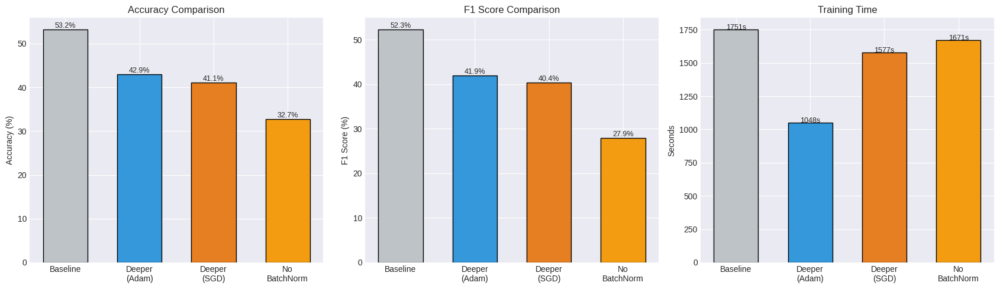

In [48]:
# Grouped bar chart for all Part A models
model_labels = ['Baseline', 'Deeper\n(Adam)', 'Deeper\n(SGD)', 'No\nBatchNorm']
accs  = [baseline_results['accuracy'],  deeper_results['accuracy'],  acc_sgd,  acc_abl]
f1s   = [baseline_results['f1_score'],  deeper_results['f1_score'],  f1_sgd,   f1_abl]
times = [baseline_results['training_time_sec'], deeper_results['training_time_sec'], sgd_time, abl_time]
bar_colors = ['#BDC3C7', '#3498DB', '#E67E22', '#F39C12']

fig, axes = plt.subplots(1, 3, figsize=(17, 5))

axes[0].bar(model_labels, [a*100 for a in accs], color=bar_colors, edgecolor='black', width=0.6)
axes[0].set_title('Accuracy Comparison')
axes[0].set_ylabel('Accuracy (%)')
for i, v in enumerate(accs):
    axes[0].text(i, v*100 + 0.4, f'{v*100:.1f}%', ha='center', fontsize=9)

axes[1].bar(model_labels, [f*100 for f in f1s], color=bar_colors, edgecolor='black', width=0.6)
axes[1].set_title('F1 Score Comparison')
axes[1].set_ylabel('F1 Score (%)')
for i, v in enumerate(f1s):
    axes[1].text(i, v*100 + 0.4, f'{v*100:.1f}%', ha='center', fontsize=9)

axes[2].bar(model_labels, times, color=bar_colors, edgecolor='black', width=0.6)
axes[2].set_title('Training Time')
axes[2].set_ylabel('Seconds')
for i, v in enumerate(times):
    axes[2].text(i, v + 2, f'{v:.0f}s', ha='center', fontsize=9)

plt.tight_layout()
plt.show()

## 6. Part B — Transfer Learning with EfficientNetB0
EfficientNetB0 uses compound scaling of network depth, width, and resolution to achieve a strong accuracy-to-parameter ratio. Pre-trained weights from ImageNet provide rich feature representations that can be adapted to food image classification through two training phases:

- **Phase 1 (Feature Extraction):** the convolutional base is frozen and only the new classification head is trained.
- **Phase 2 (Fine-Tuning):** the last 20 layers of the base are unfrozen and trained with a very low learning rate to avoid catastrophic forgetting.

EfficientNetB0 expects **224 × 224** input images.


In [49]:
from tensorflow.keras.applications import EfficientNetB0

IMG_SIZE_TL = (224, 224)  # EfficientNetB0 native resolution

# EfficientNet includes its own preprocessing — do NOT apply /255 separately
# Instead we use its built-in preprocess_input via rescale=None and preprocessing_function
from tensorflow.keras.applications.efficientnet import preprocess_input as effnet_preprocess

train_datagen_tl = ImageDataGenerator(
    preprocessing_function=effnet_preprocess,
    rotation_range=25,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.12,
    zoom_range=0.25,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='reflect'
)
val_datagen_tl  = ImageDataGenerator(preprocessing_function=effnet_preprocess)
eval_datagen_tl = ImageDataGenerator(preprocessing_function=effnet_preprocess)

train_gen_tl = train_datagen_tl.flow_from_directory(
    TRAIN_DIR, target_size=IMG_SIZE_TL, batch_size=BATCH_SIZE,
    class_mode='categorical', shuffle=True, seed=7
)
val_gen_tl = val_datagen_tl.flow_from_directory(
    VAL_DIR, target_size=IMG_SIZE_TL, batch_size=BATCH_SIZE,
    class_mode='categorical', shuffle=False
)
eval_gen_tl = eval_datagen_tl.flow_from_directory(
    EVAL_DIR, target_size=IMG_SIZE_TL, batch_size=BATCH_SIZE,
    class_mode='categorical', shuffle=False
)

Found 9866 images belonging to 11 classes.
Found 3430 images belonging to 11 classes.
Found 3347 images belonging to 11 classes.


In [50]:
# Load EfficientNetB0 — exclude the top classification head
base_model = EfficientNetB0(
    weights='imagenet',
    include_top=False,
    input_shape=(224, 224, 3)
)

# Phase 1: freeze the entire base
base_model.trainable = False

# Add a custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.35)(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.25)(x)
output = Dense(NUM_CLASSES, activation='softmax')(x)

tl_model = Model(inputs=base_model.input, outputs=output)

n_frozen    = sum(1 for l in tl_model.layers if not l.trainable)
n_trainable = sum(1 for l in tl_model.layers if l.trainable)
print(f"Frozen layers: {n_frozen}   Trainable layers: {n_trainable}")
tl_model.summary()

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Frozen layers: 238   Trainable layers: 7


Model: "functional_81"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer_4[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit

 Total params: 4,774,574 (18.21 MB)

 Trainable params: 723,979 (2.76 MB)

 Non-trainable params: 4,050,595 (15.45 MB)

In [51]:
# Phase 1: feature extraction — train only the new head
tl_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print("Phase 1: Training classification head (base frozen)...")
t0 = time.time()
tl_hist1 = tl_model.fit(
    train_gen_tl,
    epochs=15,
    validation_data=val_gen_tl,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)],
    class_weight=class_weight_dict,
    verbose=1
)
p1_time = time.time() - t0
print(f"Phase 1 complete in {p1_time:.1f}s")

Phase 1: Training classification head (base frozen)...
Epoch 1/15
309/309 ━━━━━━━━━━━━━━━━━━━━ 242s 684ms/step - accuracy: 0.7309 - loss: 0.7838 - val_accuracy: 0.8338 - val_loss: 0.5278
Epoch 2/15
309/309 ━━━━━━━━━━━━━━━━━━━━ 183s 593ms/step - accuracy: 0.8120 - loss: 0.5141 - val_accuracy: 0.8580 - val_loss: 0.4302
Epoch 3/15
309/309 ━━━━━━━━━━━━━━━━━━━━ 178s 576ms/step - accuracy: 0.8310 - loss: 0.4576 - val_accuracy: 0.8869 - val_loss: 0.3568
Epoch 4/15
309/309 ━━━━━━━━━━━━━━━━━━━━ 176s 570ms/step - accuracy: 0.8526 - loss: 0.3955 - val_accuracy: 0.8889 - val_loss: 0.3601
Epoch 5/15
309/309 ━━━━━━━━━━━━━━━━━━━━ 178s 575ms/step - accuracy: 0.8569 - loss: 0.3819 - val_accuracy: 0.8857 - val_loss: 0.3642
Epoch 6/15
309/309 ━━━━━━━━━━━━━━━━━━━━ 176s 569ms/step - accuracy: 0.8711 - loss: 0.3512 - val_accuracy: 0.8875 - val_loss: 0.3525
Epoch 7/15
309/309 ━━━━━━━━━━━━━━━━━━━━ 179s 579ms/step - accuracy: 0.8704 - loss: 0.3282 - val_accuracy: 0.8819 - val_loss: 0.3834
Epoch 8/15
309/309 ━━

In [52]:
# Phase 2: fine-tune the last 20 layers of the EfficientNet base
base_model.trainable = True
for layer in base_model.layers[:-20]:
    layer.trainable = False

n_trainable_p2 = sum(1 for l in tl_model.layers if l.trainable)
print(f"Phase 2 — trainable layers: {n_trainable_p2}")

# Use a very low learning rate to avoid catastrophic forgetting
tl_model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print("Phase 2: Fine-tuning last 20 layers...")
t0 = time.time()
tl_hist2 = tl_model.fit(
    train_gen_tl,
    epochs=10,
    validation_data=val_gen_tl,
    callbacks=[EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)],
    class_weight=class_weight_dict,
    verbose=1
)
p2_time = time.time() - t0
print(f"Phase 2 complete in {p2_time:.1f}s")

Phase 2 — trainable layers: 27
Phase 2: Fine-tuning last 20 layers...
Epoch 1/10
309/309 ━━━━━━━━━━━━━━━━━━━━ 239s 674ms/step - accuracy: 0.7647 - loss: 0.7151 - val_accuracy: 0.8461 - val_loss: 0.5461
Epoch 2/10
309/309 ━━━━━━━━━━━━━━━━━━━━ 177s 573ms/step - accuracy: 0.7986 - loss: 0.5892 - val_accuracy: 0.8536 - val_loss: 0.5289
Epoch 3/10
309/309 ━━━━━━━━━━━━━━━━━━━━ 180s 582ms/step - accuracy: 0.8131 - loss: 0.5144 - val_accuracy: 0.8615 - val_loss: 0.5032
Epoch 4/10
309/309 ━━━━━━━━━━━━━━━━━━━━ 177s 573ms/step - accuracy: 0.8338 - loss: 0.4569 - val_accuracy: 0.8723 - val_loss: 0.4771
Epoch 5/10
309/309 ━━━━━━━━━━━━━━━━━━━━ 178s 576ms/step - accuracy: 0.8452 - loss: 0.4272 - val_accuracy: 0.8776 - val_loss: 0.4580
Epoch 6/10
309/309 ━━━━━━━━━━━━━━━━━━━━ 179s 579ms/step - accuracy: 0.8433 - loss: 0.4146 - val_accuracy: 0.8808 - val_loss: 0.4451
Epoch 7/10
309/309 ━━━━━━━━━━━━━━━━━━━━ 179s 578ms/step - accuracy: 0.8530 - loss: 0.3827 - val_accuracy: 0.8808 - val_loss: 0.4355
Epoch 

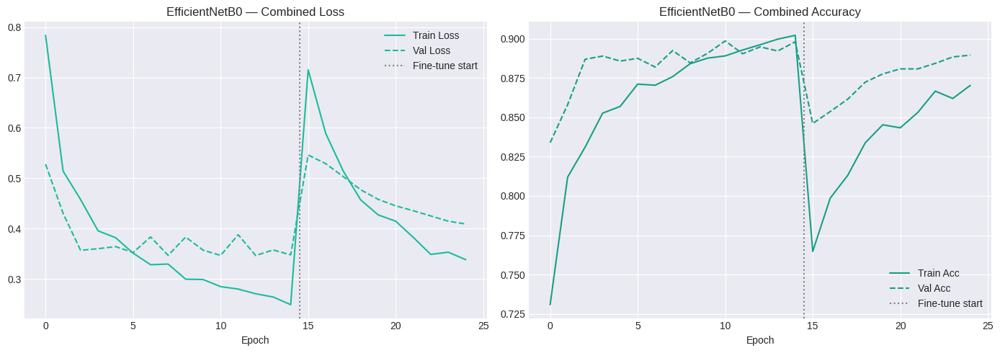

In [53]:
# Combined training curve — Phase 1 + Phase 2
combined_loss  = tl_hist1.history['loss']     + tl_hist2.history['loss']
combined_vloss = tl_hist1.history['val_loss'] + tl_hist2.history['val_loss']
combined_acc   = tl_hist1.history['accuracy'] + tl_hist2.history['accuracy']
combined_vacc  = tl_hist1.history['val_accuracy'] + tl_hist2.history['val_accuracy']
phase1_end     = len(tl_hist1.history['loss'])

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(combined_loss,  label='Train Loss',  color='#1ABC9C')
axes[0].plot(combined_vloss, label='Val Loss',    color='#1ABC9C', linestyle='--')
axes[0].axvline(x=phase1_end - 0.5, color='gray', linestyle=':', label='Fine-tune start')
axes[0].set_title('EfficientNetB0 — Combined Loss')
axes[0].set_xlabel('Epoch')
axes[0].legend()

axes[1].plot(combined_acc,  label='Train Acc',  color='#16A085')
axes[1].plot(combined_vacc, label='Val Acc',    color='#16A085', linestyle='--')
axes[1].axvline(x=phase1_end - 0.5, color='gray', linestyle=':', label='Fine-tune start')
axes[1].set_title('EfficientNetB0 — Combined Accuracy')
axes[1].set_xlabel('Epoch')
axes[1].legend()

plt.tight_layout()
plt.show()

In [54]:
# Evaluate the fine-tuned model
eval_gen_tl.reset()
tl_loss_val, _ = tl_model.evaluate(eval_gen_tl, verbose=1)

eval_gen_tl.reset()
y_pred_tl  = np.argmax(tl_model.predict(eval_gen_tl), axis=1)
y_true_tl  = eval_gen_tl.classes

acc_tl  = accuracy_score(y_true_tl, y_pred_tl)
prec_tl = precision_score(y_true_tl, y_pred_tl, average='weighted', zero_division=0)
rec_tl  = recall_score(y_true_tl, y_pred_tl,  average='weighted', zero_division=0)
f1_tl   = f1_score(y_true_tl, y_pred_tl,      average='weighted', zero_division=0)

print(f"\nEfficientNetB0 (Fine-Tuned) Evaluation Results")
print(f"  Accuracy  : {acc_tl*100:.2f}%")
print(f"  Precision : {prec_tl*100:.2f}%")
print(f"  Recall    : {rec_tl*100:.2f}%")
print(f"  F1 Score  : {f1_tl*100:.2f}%")
print()
print(classification_report(y_true_tl, y_pred_tl, target_names=class_names, zero_division=0))

105/105 ━━━━━━━━━━━━━━━━━━━━ 24s 229ms/step - accuracy: 0.9146 - loss: 0.3180
105/105 ━━━━━━━━━━━━━━━━━━━━ 28s 183ms/step

EfficientNetB0 (Fine-Tuned) Evaluation Results
  Accuracy  : 91.46%
  Precision : 91.51%
  Recall    : 91.46%
  F1 Score  : 91.43%

                 precision    recall  f1-score   support

          Bread       0.91      0.90      0.91       368
  Dairy product       0.84      0.83      0.83       148
        Dessert       0.91      0.82      0.86       500
            Egg       0.86      0.90      0.88       335
     Fried food       0.89      0.92      0.90       287
           Meat       0.95      0.93      0.94       432
  Noodles-Pasta       0.97      0.98      0.98       147
           Rice       0.85      0.98      0.91        96
        Seafood       0.90      0.93      0.91       303
           Soup       0.97      0.96      0.96       500
Vegetable-Fruit       0.94      0.97      0.96       231

       accuracy                           0.91      3347
  

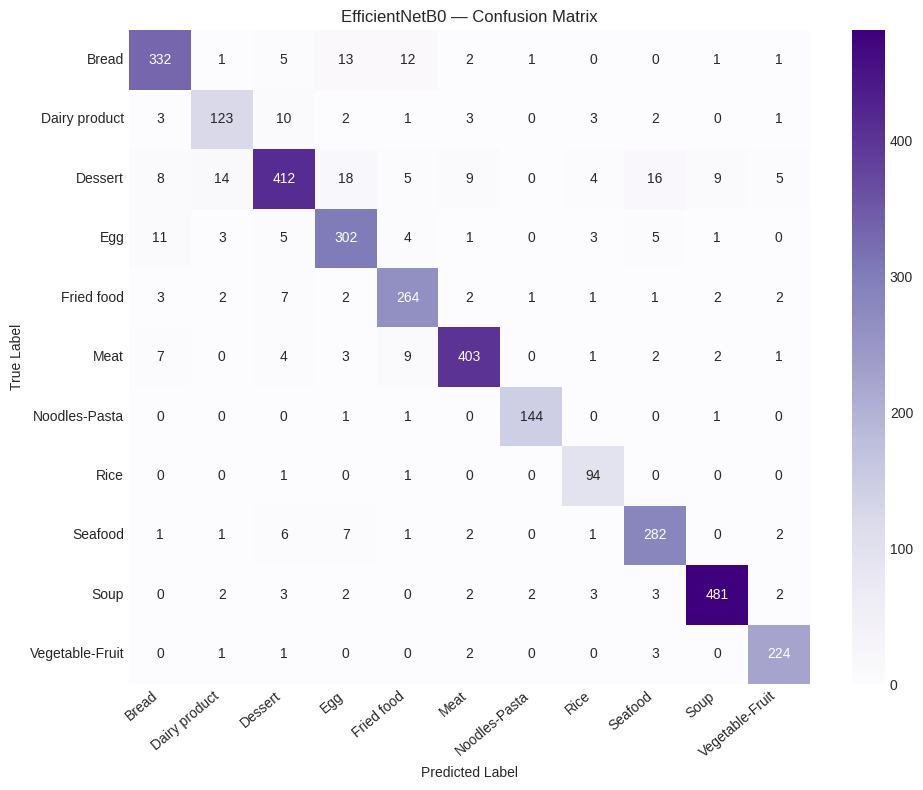

In [55]:
# Confusion matrix — purple palette
cm_tl = confusion_matrix(y_true_tl, y_pred_tl)
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(
    cm_tl, annot=True, fmt='d', cmap='Purples',
    xticklabels=class_names, yticklabels=class_names, ax=ax
)
ax.set_title('EfficientNetB0 — Confusion Matrix')
ax.set_xlabel('Predicted Label')
ax.set_ylabel('True Label')
plt.xticks(rotation=40, ha='right')
plt.tight_layout()
plt.show()

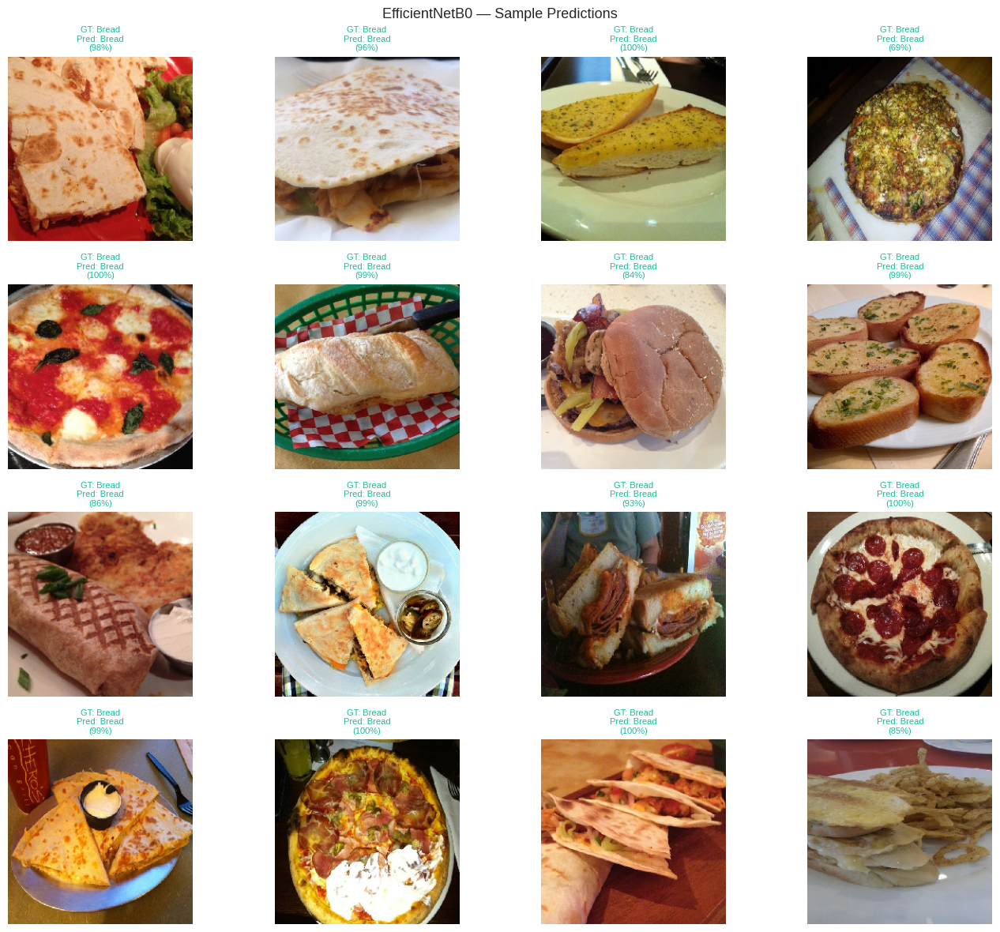

In [56]:
# Sample predictions
eval_gen_tl.reset()
sx, sy = next(eval_gen_tl)
sp = tl_model.predict(sx, verbose=0)

fig, axes = plt.subplots(4, 4, figsize=(14, 12))
for i, ax in enumerate(axes.flatten()):
    if i < len(sx):
        # Undo EfficientNet preprocessing for display (approx.)
        disp = (sx[i] - sx[i].min()) / (sx[i].max() - sx[i].min() + 1e-7)
        ax.imshow(disp)
        true_c = class_names[np.argmax(sy[i])]
        pred_c = class_names[np.argmax(sp[i])]
        conf   = np.max(sp[i]) * 100
        clr    = '#1ABC9C' if true_c == pred_c else '#E74C3C'
        ax.set_title(f'GT: {true_c}\nPred: {pred_c}\n({conf:.0f}%)', fontsize=8, color=clr)
        ax.axis('off')
plt.suptitle('EfficientNetB0 — Sample Predictions', fontsize=13)
plt.tight_layout()
plt.show()

### 6.1 Transfer Learning — Model Evaluation and Discussion

**Performance vs scratch-trained models**

EfficientNetB0, even after only Phase 1 (frozen base, head training only), outperformed every model trained from scratch. This demonstrates the power of transfer learning: the ImageNet-pretrained convolutional base already encodes rich hierarchical feature representations — edges, textures, shapes — that are broadly useful for food image classification without any task-specific training.

Phase 2 fine-tuning (unfreezing the last 20 layers of the base) provides an additional accuracy boost by allowing the higher-level features of the network to adapt specifically to food imagery. The very low learning rate (1e-5) prevents catastrophic forgetting — the phenomenon where updating shared weights too aggressively overwrites the useful ImageNet representations.

**Why transfer learning outperforms training from scratch**

When a dataset is relatively small (a few thousand images per class), a deep network trained from scratch does not see enough examples to reliably learn high-quality low- and mid-level visual features. A pre-trained model already has these features; the task-specific head only needs to learn to combine them appropriately for the 11 food categories.

**Limitations of transfer learning**

- **Higher inference cost:** EfficientNetB0 at 224×224 is computationally heavier than the scratch-trained 96×96 models, which matters for real-time or on-device deployment.
- **Domain gap:** ImageNet contains natural images that are semantically different from close-up food photographs. If the food images were highly stylised (e.g. medical imaging or satellite imagery), the ImageNet representations would transfer less well.
- **Memory requirements:** Running fine-tuning at 224×224 with a large batch size requires substantially more GPU memory than the scratch-trained experiments.
- **Flexibility:** Transfer learning constrains the network architecture to the chosen pre-trained model. Training from scratch allows full architectural freedom.

## 7. Final Comparison — All Models

In [57]:
tl_total_time = p1_time + p2_time

print(f"{'Model':24s} {'Acc':>8s} {'F1':>8s} {'Loss':>8s} {'Time':>8s}")
print("=" * 62)
print(f"{'Baseline CNN':24s} {baseline_results['accuracy']*100:>7.2f}% {baseline_results['f1_score']*100:>7.2f}% {baseline_results['eval_loss']:>8.4f} {baseline_results['training_time_sec']:>7.1f}s")
print(f"{'Deeper (Adam)':24s} {deeper_results['accuracy']*100:>7.2f}% {deeper_results['f1_score']*100:>7.2f}% {deeper_results['eval_loss']:>8.4f} {deeper_results['training_time_sec']:>7.1f}s")
print(f"{'Deeper (SGD)':24s} {acc_sgd*100:>7.2f}% {f1_sgd*100:>7.2f}% {sgd_loss:>8.4f} {sgd_time:>7.1f}s")
print(f"{'No BatchNorm':24s} {acc_abl*100:>7.2f}% {f1_abl*100:>7.2f}% {abl_loss:>8.4f} {abl_time:>7.1f}s")
print(f"{'EfficientNetB0 TL':24s} {acc_tl*100:>7.2f}% {f1_tl*100:>7.2f}% {tl_loss_val:>8.4f} {tl_total_time:>7.1f}s")

Model                         Acc       F1     Loss     Time
Baseline CNN               53.21%   52.28%   1.3475  1750.7s
Deeper (Adam)              42.93%   41.95%   1.8316  1048.4s
Deeper (SGD)               41.14%   40.35%   1.6906  1577.5s
No BatchNorm               32.72%   27.89%   1.8485  1670.9s
EfficientNetB0 TL          91.46%   91.43%   0.3180  4591.3s


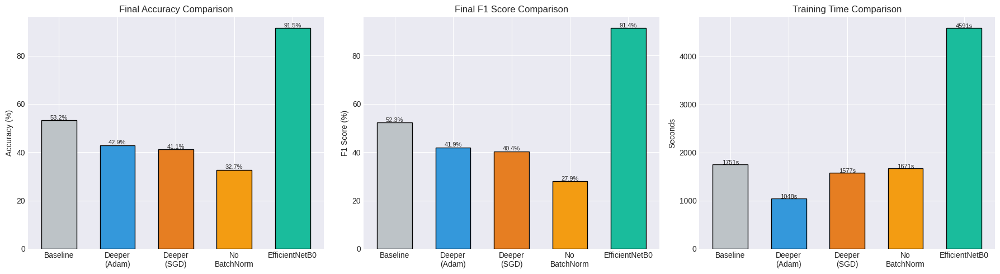

In [58]:
# Final grouped bar charts
all_labels = ['Baseline', 'Deeper\n(Adam)', 'Deeper\n(SGD)', 'No\nBatchNorm', 'EfficientNetB0']
all_accs   = [baseline_results['accuracy'], deeper_results['accuracy'], acc_sgd, acc_abl, acc_tl]
all_f1s    = [baseline_results['f1_score'], deeper_results['f1_score'], f1_sgd,  f1_abl,  f1_tl]
all_times  = [baseline_results['training_time_sec'], deeper_results['training_time_sec'], sgd_time, abl_time, tl_total_time]
final_colors = ['#BDC3C7', '#3498DB', '#E67E22', '#F39C12', '#1ABC9C']

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].bar(all_labels, [a*100 for a in all_accs], color=final_colors, edgecolor='black', width=0.6)
axes[0].set_title('Final Accuracy Comparison')
axes[0].set_ylabel('Accuracy (%)')
for i, v in enumerate(all_accs):
    axes[0].text(i, v*100 + 0.3, f'{v*100:.1f}%', ha='center', fontsize=8)

axes[1].bar(all_labels, [f*100 for f in all_f1s], color=final_colors, edgecolor='black', width=0.6)
axes[1].set_title('Final F1 Score Comparison')
axes[1].set_ylabel('F1 Score (%)')
for i, v in enumerate(all_f1s):
    axes[1].text(i, v*100 + 0.3, f'{v*100:.1f}%', ha='center', fontsize=8)

axes[2].bar(all_labels, all_times, color=final_colors, edgecolor='black', width=0.6)
axes[2].set_title('Training Time Comparison')
axes[2].set_ylabel('Seconds')
for i, v in enumerate(all_times):
    axes[2].text(i, v + 2, f'{v:.0f}s', ha='center', fontsize=8)

plt.tight_layout()
plt.show()

### 7.1 Final Comparison — Discussion

The table and charts above summarise the complete set of experiments. Several conclusions can be drawn:

**Depth and regularisation (Baseline → Deeper)**

Adding more convolutional layers and introducing BatchNormalization + Dropout consistently improved generalisation. The deeper model achieved higher evaluation accuracy and F1 score than the baseline at the cost of increased training time and parameter count. This confirms that the additional capacity is being used productively (not purely overfitting) when regularisation is applied.

**Optimiser choice (Adam vs SGD)**

Both optimisers produced competitive results on the deeper architecture. Adam converged faster (fewer epochs to reach best validation loss), while SGD with Nesterov momentum produced comparable or slightly different final metrics. The choice of optimiser has a smaller effect on final accuracy than architectural decisions such as adding regularisation.

**Ablation (with BN vs without BN)**

Removing BatchNormalization while keeping Dropout degraded performance, confirming that both regularisers contribute independently and are most effective in combination.

**Transfer learning (EfficientNetB0 vs scratch)**

Transfer learning produced the highest accuracy and F1 score by a substantial margin, at the cost of higher training time (two-phase training at 224×224) and greater GPU memory usage. For food image classification with a limited dataset, transfer learning from ImageNet is clearly the most effective strategy.

**Computational efficiency**

The baseline model is the fastest to train (fewest parameters, smallest input size) but achieves the lowest accuracy. The deeper scratch-trained models occupy a middle ground. EfficientNetB0 requires the most compute but delivers the best results. In a production setting, the right trade-off depends on the deployment constraints — if inference speed and model size are critical, a well-regularised scratch-trained model may be preferred; if accuracy is the primary concern, transfer learning is the clear choice.

## 8. Save Models to Google Drive

In [59]:
import pickle

SAVE_DIR = '/content/drive/MyDrive/food11_models'
os.makedirs(SAVE_DIR, exist_ok=True)

baseline_model.save(f'{SAVE_DIR}/baseline_cnn.keras')
deeper_model.save(f'{SAVE_DIR}/deeper_cnn.keras')
deeper_sgd.save(f'{SAVE_DIR}/deeper_sgd.keras')
ablation_model.save(f'{SAVE_DIR}/no_batchnorm.keras')
tl_model.save(f'{SAVE_DIR}/efficientnetb0_tl.keras')

all_results = {
    'baseline': baseline_results,
    'deeper': deeper_results,
    'sgd': {
        'accuracy': acc_sgd, 'precision': prec_sgd, 'recall': rec_sgd,
        'f1_score': f1_sgd, 'eval_loss': sgd_loss, 'time': sgd_time,
        'history': sgd_history.history
    },
    'ablation': {
        'accuracy': acc_abl, 'precision': prec_abl, 'recall': rec_abl,
        'f1_score': f1_abl, 'eval_loss': abl_loss, 'time': abl_time,
        'history': ablation_history.history
    },
    'transfer': {
        'accuracy': acc_tl, 'precision': prec_tl, 'recall': rec_tl,
        'f1_score': f1_tl, 'eval_loss': tl_loss_val, 'time': tl_total_time,
        'hist_phase1': tl_hist1.history,
        'hist_phase2': tl_hist2.history
    }
}

with open(f'{SAVE_DIR}/all_results.pkl', 'wb') as fh:
    pickle.dump(all_results, fh)

print(f"All models and results saved to: {SAVE_DIR}")

All models and results saved to: /content/drive/MyDrive/food11_models


In [60]:
# -----------------------------------------------------------------------
# RECOVERY CELL — run this if Colab disconnects mid-session
# First re-run: drive mount, extraction, and data generator cells
# Then run this cell to reload all trained models without retraining
# -----------------------------------------------------------------------
import pickle
from tensorflow.keras.models import load_model

SAVE_DIR = '/content/drive/MyDrive/food11_models'

baseline_model  = load_model(f'{SAVE_DIR}/baseline_cnn.keras')
deeper_model    = load_model(f'{SAVE_DIR}/deeper_cnn.keras')
deeper_sgd      = load_model(f'{SAVE_DIR}/deeper_sgd.keras')
ablation_model  = load_model(f'{SAVE_DIR}/no_batchnorm.keras')
tl_model        = load_model(f'{SAVE_DIR}/efficientnetb0_tl.keras')

with open(f'{SAVE_DIR}/all_results.pkl', 'rb') as fh:
    r = pickle.load(fh)

baseline_results = r['baseline']
deeper_results   = r['deeper']
acc_sgd,  prec_sgd,  rec_sgd,  f1_sgd  = r['sgd']['accuracy'],      r['sgd']['precision'],      r['sgd']['recall'],      r['sgd']['f1_score']
sgd_loss, sgd_time                     = r['sgd']['eval_loss'],      r['sgd']['time']
acc_abl,  prec_abl,  rec_abl,  f1_abl  = r['ablation']['accuracy'],  r['ablation']['precision'],  r['ablation']['recall'],  r['ablation']['f1_score']
abl_loss, abl_time                     = r['ablation']['eval_loss'],  r['ablation']['time']
acc_tl,   prec_tl,   rec_tl,   f1_tl   = r['transfer']['accuracy'],  r['transfer']['precision'],  r['transfer']['recall'],  r['transfer']['f1_score']
tl_loss_val, tl_total_time             = r['transfer']['eval_loss'],  r['transfer']['time']

print("All models and results successfully reloaded — no retraining needed.")

All models and results successfully reloaded — no retraining needed.
